# Рынок заведений общественного питания Москвы



**Название проекта:**

Исследование рынка общепита Москвы.
_____
**Описание исследования:**

Инвесторы из фонда «Shut Up and Take My Money» заинтересованы в анализе перспектив их работы в новой для компании области и открыть заведение общественного питания в Москве. Заказчики на данный момент не утвердили никакие дополнительные критерии касательно категории места, его расположения, меню и цены.
_____
**Цель исследования:**

Выявить текущие тренды.
_____
**Задача исследования:**

В данном исследовании необходимо найти особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
_____
**Исходные данные:**
    
В качестве материала для анализа был получен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 год. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.
______

**Данное исследование разделим на несколько частей:**

Работа над данным проектом была разделена на 4 шага:
1) [Изучение общей информации](#start)

2) [Предобработка данных](#then)
- 2.1 [Обработка типов данных](#then1i)
- 2.2 [Обработка пропущенных значений в данных](#then1)
- 2.3 [Обработка дубликатов](#then2)
- 2.4 [Добавление новых показателей](#then3)

3) [Исследовательский анализ данных](#after)

4) [Детализация исследования: открытие кофейни](#end)

5) [Вывод про проекту](#ending)
_________________


</div>

# Шаг 1. Изучение общей информации.
<a id="start"></a>

In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import folium
import json
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster

In [2]:
places_1 = pd.read_csv ('/datasets/moscow_places.csv')
places_1.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
places_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
places_1.columns

Index(['name', 'category', 'address', 'district', 'hours', 'lat', 'lng',
       'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
       'chain', 'seats'],
      dtype='object')

In [5]:
places_1.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [6]:
places_1.duplicated().sum()

0

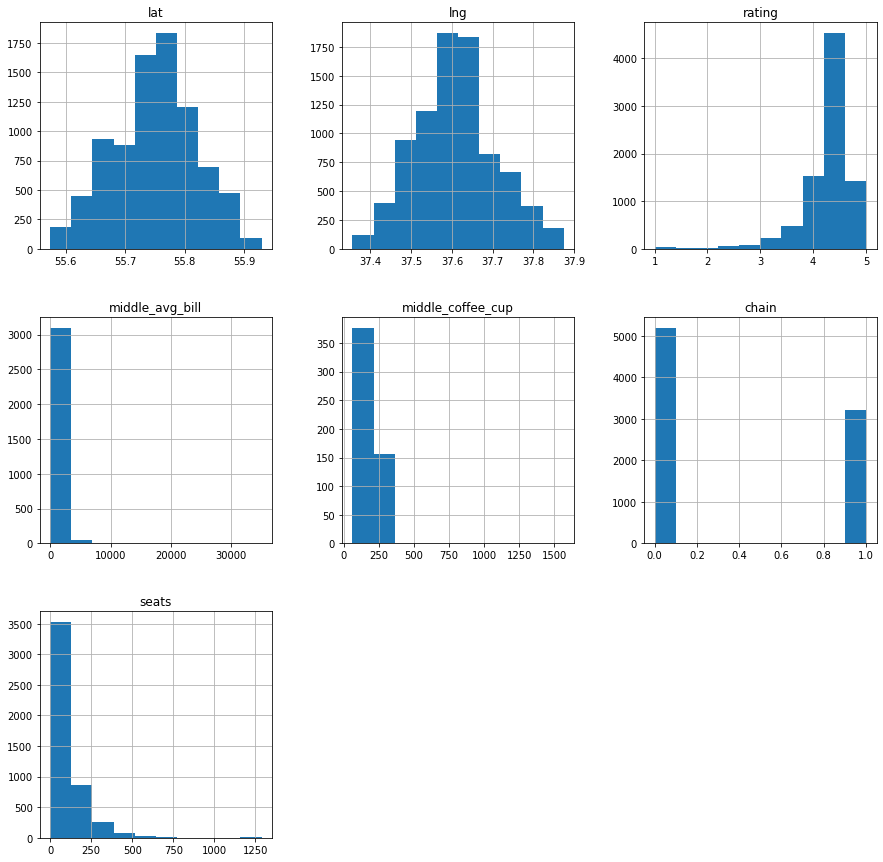

In [8]:
places_1.hist(figsize = (15, 15))
plt.show()

<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
    
***Вывод:*** \
\
На данном этапе были открыты файлы с данными, и сохранен в переменную 'places_1'. Далее была изучена общая информация по нему для возможности приступить к дальнейшим шагам работы.
    
В датасете 'places_1' находяться 14 (четырнадцать) столбцов, содержащих следующие данные:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:\
  «Средний счёт: 1000–1500 ₽»;\
  «Цена чашки капучино: 130–220 ₽»;\
  «Цена бокала пива: 400–600 ₽» и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
  Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:\
 Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.\
 Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.\
 Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):\
  0 — заведение не является сетевым\
  1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.
    
Было обнаружено что, столбцы 'chain' и 'seats' - имеют некорректные типы данных, что может отразиться на будущих результатах. Однако, столбец 'seats', при дальнейшем ознакомлении с данными, имеет пропущенные/отсутсвующие значения, что не противоречит имеющимуся у него типу данных. Опираясь на данное предположение, на следущем этапе будут обработаны данный лишь столбца 'chain' будут заново проанализированы для устранения такого рода ошибок.
    
При анализе заголовков столбцов не было выявлено никаких замечаний, которые должны подвергнуться дополнительному анализу.

Однако, было обаружено, что в 6 (шести) следующих столбцах: 'hours', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', 'seats' - присутсвуют пропущенные значения, они будут также более подробно изучены и устранены по возможности на следующем этапе работы. 
    
Стоит отметить, что в данных не были обнаружены явные дубликаты данных, что свидетельствует о том, что абсолютно идентичные строки с информацией в файле не находятся. Данное заключение важно для дальнейшей работы, так как исследование будет проходить по кофейням, чьи названия и другие параметры могут поторяться, однако, абсолютно одинаковых кофеен быть не может. 

# Шаг 2. Предобработка данных.
<a id="then"></a>

# Шаг 2.1 Обработка типов данных
<a id="then1i"></a>

In [9]:
places_1 ['chain'] = places_1 ['chain'].astype(bool)
places_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   bool   
 13  seats              4795 non-null   float64
dtypes: bool(1), float64(6), object(7)
memory usage: 862.1+ KB


<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
    
***Вывод:*** \
\
На данном этапе был изменен тип данных столбца 'chain', который показывает, является ли заведение сетевым, на булев для упрощения работы над ним на других этапах работы.

# Шаг 2.2 Обработка пропущенных значений в данных
<a id="then1"></a>

In [10]:
places_1.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [11]:
places_1[places_1['hours'].isna()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
38,Ижора,булочная,"Москва, Ижорский проезд, 5А",Северный административный округ,NaN,55.888366,37.514856,4.4,NaN,NaN,NaN,NaN,False,NaN
40,Кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.895115,37.524902,3.7,NaN,NaN,NaN,NaN,False,NaN
44,Кафетерий,кафе,"Москва, Ангарская улица, 24А",Северный административный округ,NaN,55.876289,37.519315,3.8,NaN,NaN,NaN,NaN,True,8.0
56,Рыба из тандыра,быстрое питание,"Москва, Коровинское шоссе, 46, стр. 5",Северный административный округ,NaN,55.888010,37.515960,1.5,NaN,NaN,NaN,NaN,False,NaN
108,Кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8236,1у,кафе,"Москва, Нагатинская набережная, 40/1к1",Южный административный округ,NaN,55.685528,37.673546,3.4,NaN,NaN,NaN,NaN,False,NaN
8375,Улица Гурьянова 55,кафе,"Москва, улица Гурьянова, 55",Юго-Восточный административный округ,NaN,55.679981,37.717034,4.5,NaN,NaN,NaN,NaN,False,NaN
8378,Восточно-грузинская кухня,быстрое питание,"Москва, Зеленодольская улица, 32, корп. 3",Юго-Восточный административный округ,NaN,55.710540,37.767864,4.3,NaN,NaN,NaN,NaN,False,120.0
8381,Аэлита,кафе,"Москва, Ферганская улица, 8, корп. 2, стр. 1",Юго-Восточный административный округ,NaN,55.708871,37.803831,3.8,NaN,NaN,NaN,NaN,False,30.0


In [12]:
places_1['hours'] = places_1['hours'].fillna('Не указано')

**Пояснение:**

Столбец 'hours', содержащий информацию о днях и часах работы заведений, был обработаны на содержание в нем пропущенных значений.

Так, такие значения не были заменены ни на какое другое значение. Данное решение было принято во многом по причине того, что изначально большинство данных могли быть не указаны намеренно или нет, заменить их на среднее или другие значения невозможно по причине отсутствия другой информации, которая моглы бы являться базой для такого рода расчетов, а также такое десйствие не несет в себе выгоды для расчетов по данному проекту.

Таким образом, пропущенные значения были оставлены без изменений, что даст возможность в дальнейшем получить более точные и достоверные рассчеты.

In [13]:
places_1[places_1['price'].isna()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,NaN
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN
11,Шашлык Шефф,кафе,"Москва, улица Маршала Федоренко, 10с1",Северный административный округ,"ежедневно, 10:00–21:00",55.881770,37.492362,4.9,NaN,NaN,NaN,NaN,False,NaN
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,True,180.0
19,Пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,True,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,False,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,False,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,False,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,True,150.0


**Пояснение:**

Столбец 'price', содержащий информацию о категориях цен в заведениях, был обработаны на содержание в нем пропущенных значений.

Так, такие значения не были заменены ни на какое другое значение. Данное решение было принято во многом по причине того, что изначально большинство данных могли быть не указаны намеренно или нет, заменить их на среднее или другие значения невозможно по причине отсутствия другой информации, которая моглы бы являться базой для такого рода расчетов, а также такое десйствие не несет в себе выгоды для расчетов по данному проекту.

Таким образом, пропущенные значения были оставлены без изменений, что даст возможность в дальнейшем получить более точные и достоверные рассчеты.

In [14]:
places_1[places_1['avg_bill'].isna()] 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,NaN
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,False,NaN
11,Шашлык Шефф,кафе,"Москва, улица Маршала Федоренко, 10с1",Северный административный округ,"ежедневно, 10:00–21:00",55.881770,37.492362,4.9,NaN,NaN,NaN,NaN,False,NaN
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,True,180.0
19,Пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,True,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8400,Практика Кофе,кофейня,"Москва, Чонгарский бульвар, 26А, корп. 1",Юго-Западный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.654289,37.600722,4.4,NaN,NaN,NaN,NaN,False,55.0
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,False,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,False,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,True,150.0


**Пояснение:**

Столбец 'avg_bill', содержащий информацию о средней стоимости заказа в виде диапазона в заведениях, был обработаны на содержание в нем пропущенных значений.

Так, такие значения не были заменены ни на какое другое значение. Данное решение было принято во многом по причине того, что изначально большинство данных могли быть не указаны намеренно или нет, заменить их на среднее или другие значения невозможно по причине отсутствия другой информации, которая моглы бы являться базой для такого рода расчетов, а также такое десйствие не несет в себе выгоды для расчетов по данному проекту.

Таким образом, пропущенные значения были оставлены без изменений, что даст возможность в дальнейшем получить более точные и достоверные рассчеты.

In [15]:
places_1[places_1['middle_avg_bill'].isna()]  

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,NaN
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,False,NaN
10,Great Room Bar,"бар,паб","Москва, Левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,NaN,NaN,False,102.0
11,Шашлык Шефф,кафе,"Москва, улица Маршала Федоренко, 10с1",Северный административный округ,"ежедневно, 10:00–21:00",55.881770,37.492362,4.9,NaN,NaN,NaN,NaN,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8400,Практика Кофе,кофейня,"Москва, Чонгарский бульвар, 26А, корп. 1",Юго-Западный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.654289,37.600722,4.4,NaN,NaN,NaN,NaN,False,55.0
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,False,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,False,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,True,150.0


**Пояснение:**

Столбец 'middle_avg_bill', содержащий число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, был обработаны на содержание в нем пропущенных значений.

Так, такие значения не были заменены ни на какое другое значение. Данное решение было принято во многом по причине того, что изначально большинство данных могли быть не указаны намеренно или нет, заменить их на среднее или другие значения невозможно по причине отсутствия другой информации, которая моглы бы являться базой для такого рода расчетов, а также такое десйствие не несет в себе выгоды для расчетов по данному проекту.

Таким образом, пропущенные значения были оставлены без изменений, что даст возможность в дальнейшем получить более точные и достоверные рассчеты.

In [16]:
places_1[places_1['middle_coffee_cup'].isna()]   

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45.0
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,False,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,False,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,False,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,True,150.0


**Пояснение:**

Столбец 'middle_coffee_cup', содержащий число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, был обработаны на содержание в нем пропущенных значений.

Так, такие значения не были заменены ни на какое другое значение. Данное решение было принято во многом по причине того, что изначально большинство данных могли быть не указаны намеренно или нет, заменить их на среднее или другие значения невозможно по причине отсутствия другой информации, которая моглы бы являться базой для такого рода расчетов, а также такое десйствие не несет в себе выгоды для расчетов по данному проекту.

Таким образом, пропущенные значения были оставлены без изменений, что даст возможность в дальнейшем получить более точные и достоверные рассчеты.

In [17]:
places_1[places_1['seats'].isna()]    

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,NaN
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,False,NaN
11,Шашлык Шефф,кафе,"Москва, улица Маршала Федоренко, 10с1",Северный административный округ,"ежедневно, 10:00–21:00",55.881770,37.492362,4.9,NaN,NaN,NaN,NaN,False,NaN
12,Заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8387,Pab&burg,"бар,паб","Москва, улица Михайлова, 22, корп. 4",Юго-Восточный административный округ,"ежедневно, 12:00–21:30",55.726303,37.769842,4.2,средние,Цена бокала пива:от 140 ₽,NaN,NaN,False,NaN
8389,Assa,ресторан,"Москва, улица Авиаконструктора Миля, 3А",Юго-Восточный административный округ,"пн-чт 09:00–22:00; пт,сб 09:00–23:00; вс 09:00...",55.686817,37.851225,4.9,NaN,NaN,NaN,NaN,False,NaN
8392,Касабланка,кафе,"Москва, Большая Косинская улица, 27",Восточный административный округ,пн-чт 08:00–17:00; пт 08:00–16:00,55.718514,37.857576,3.3,NaN,NaN,NaN,NaN,False,NaN
8394,Намангале,кафе,"Москва, Ферганская улица, вл17-21",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.705332,37.819244,4.3,NaN,NaN,NaN,NaN,False,NaN


**Пояснение:**

Столбец 'seats', содержащий число количество посадочных мест для каждого заведения, был обработаны на содержание в нем пропущенных значений.

Так, такие значения не были заменены ни на какое другое значение. Данное решение было принято во многом по причине того, что изначально большинство данных могли быть не указаны намеренно или нет, заменить их на среднее или другие значения невозможно по причине отсутствия другой информации, которая моглы бы являться базой для такого рода расчетов, а также такое десйствие не несет в себе выгоды для расчетов по данному проекту.

Таким образом, пропущенные значения были оставлены без изменений, что даст возможность в дальнейшем получить более точные и достоверные рассчеты.

<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
    
***Вывод:*** 
 
Пропуски были обнаружены в 6 (шести) столбцах из 14 (четырнадцати) в таблице. 

Причины появления пропусков в данных могут быть объяснены как ошибкой сервиса или его некорректной работой, ошибками при сборе данных, а также специальным пропуском данного поля. Тем не менее, такие пропуски не были заменены ни на какое другое значение. Данное решение было принято по причине того, что данные пропуски появились в результате какой-либо автоматической ошибки или упущении при заполнении данных, а так как настоящая природа их возникновения не может быть выявлена и отсутствует другая информации, которая моглы бы являться базой для такого рода расчетов, следует, что заменить их на среднее или другие значения невозможно. 

# Шаг 2.3 Обработка дубликатов
<a id="then2"></a>

In [18]:
places_1.duplicated().sum()

0

In [19]:
places_1.nunique()

name                 5614
category                8
address              5753
district                9
hours                1308
lat                  8209
lng                  8258
rating                 41
price                   4
avg_bill              897
middle_avg_bill       230
middle_coffee_cup      96
chain                   2
seats                 229
dtype: int64

In [20]:
places_1 [places_1.duplicated(['name'], keep = False)]  

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148.0
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,True,180.0
19,Пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,True,NaN
20,Чебуреки Манты,кафе,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880287,37.448646,4.3,NaN,NaN,NaN,NaN,True,148.0
23,Буханка,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,True,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8317,Беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,True,NaN
8340,Семейный Очаг,ресторан,"Москва, Шоссейная улица, 13",Юго-Восточный административный округ,"ежедневно, 12:00–00:00",55.688104,37.725197,4.3,средние,Средний счёт:до 1000 ₽,1000.0,NaN,True,98.0
8372,Чайхана Sabr,ресторан,"Москва, улица Хлобыстова, 22",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.716361,37.813436,3.9,средние,Средний счёт:150–350 ₽,250.0,NaN,True,32.0
8379,Лагман Хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,True,40.0


In [21]:
places_1['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [22]:
places_1['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [23]:
places_1 [places_1[['name', 'address']].duplicated()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
    
***Вывод:*** 
 
Была проанилизирована вся таблица на предмет наличия в ней явных (полностью идентичных) дибликатов данных. А также был получен список с уникальными значениями по каждому столбцу отдельно, на котором видно, что такое число в каждом столбце разное и не равно общему количеству.

Так, согласно вычислениям таких данных в таблице нет.

# Шаг 2.4 Добавление новых показателей
<a id="then3"></a>

In [24]:
places_1 ['address'] = places_1 ['address'].str.split(pat = ',')
places_1 ['street'] = places_1 ['address'].str.get(1)

In [25]:
places_1 ['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [26]:
places_1 [places_1 ['hours'] == 'ежедневно, круглосуточно']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
10,Great Room Bar,"бар,паб","[Москва, Левобережная улица, 12]",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,NaN,NaN,False,102.0,Левобережная улица
17,Чайхана Беш-Бармак,ресторан,"[Москва, Ленинградское шоссе, 71Б, стр. 2]",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,False,96.0,Ленинградское шоссе
19,Пекарня,булочная,"[Москва, Ижорский проезд, 5]",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,True,NaN,Ижорский проезд
24,Drive Café,кафе,"[Москва, улица Дыбенко, 9Ас1]",Северный административный округ,"ежедневно, круглосуточно",55.879992,37.481571,4.0,NaN,NaN,NaN,NaN,True,NaN,улица Дыбенко
49,2U-Ту-Ю,пиццерия,"[Москва, Ижорская улица, 8А]",Северный административный округ,"ежедневно, круглосуточно",55.886160,37.508784,2.7,NaN,Средний счёт:900 ₽,900.0,NaN,False,NaN,Ижорская улица
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8394,Намангале,кафе,"[Москва, Ферганская улица, вл17-21]",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.705332,37.819244,4.3,NaN,NaN,NaN,NaN,False,NaN,Ферганская улица
8399,"Пекарня, кафе-гриль",булочная,"[Москва, Болотниковская улица, 52, корп. 2]",Юго-Западный административный округ,"ежедневно, круглосуточно",55.662866,37.582572,4.2,NaN,Средний счёт:50–250 ₽,150.0,NaN,False,50.0,Болотниковская улица
8403,Самовар,кафе,"[Москва, Люблинская улица, 112А, стр. 1]",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,False,150.0,Люблинская улица
8404,Чайхана Sabr,кафе,"[Москва, Люблинская улица, 112А, стр. 1]",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,True,150.0,Люблинская улица


In [27]:
def every_hour_not (hours):
    if hours == 'ежедневно, круглосуточно':
        return True
    else: 
        return False
places_1 ['is_24/7'] = places_1 ['hours'].apply (every_hour_not)

In [28]:
places_1.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"[Москва, улица Дыбенко, 7/1]",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"[Москва, улица Дыбенко, 36, корп. 1]",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4.0,улица Дыбенко,False
2,Хазри,кафе,"[Москва, Клязьминская улица, 15]",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"[Москва, улица Маршала Федоренко, 12]",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"[Москва, Правобережная улица, 1Б]",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148.0,Правобережная улица,False


<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
    
***Вывод:*** 

На данном этапе в таблицу были добавлены новые столбцы для того, чтобы более цело категаризовать данные, а также нагляднее и лаконичнее продемонстрировать их, в последующем для получения более полных результатов на дальнейших этапах анализа.

Так, были сформированы следующие дополнительные столбцы:
1) 'street с названиями улиц из столбца с адресом;\
2) 'is_24/7' с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

# Шаг 3. Исследовательский анализ данных.
<a id="after"></a>

***- Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.***

In [29]:
places_category = places_1.pivot_table (index = 'category', values = 'name', aggfunc = 'count').reset_index()\
.sort_values(by = 'name')
places_category ['name'] = places_category ['name'] / 8406
places_category

,category,name
1,булочная,0.030454
7,столовая,0.037473
2,быстрое питание,0.071734
5,пиццерия,0.075303
0,"бар,паб",0.091006
4,кофейня,0.168094
6,ресторан,0.243041
3,кафе,0.282893


Text(0.5, 1.0, 'Процент заведений каждой категории')

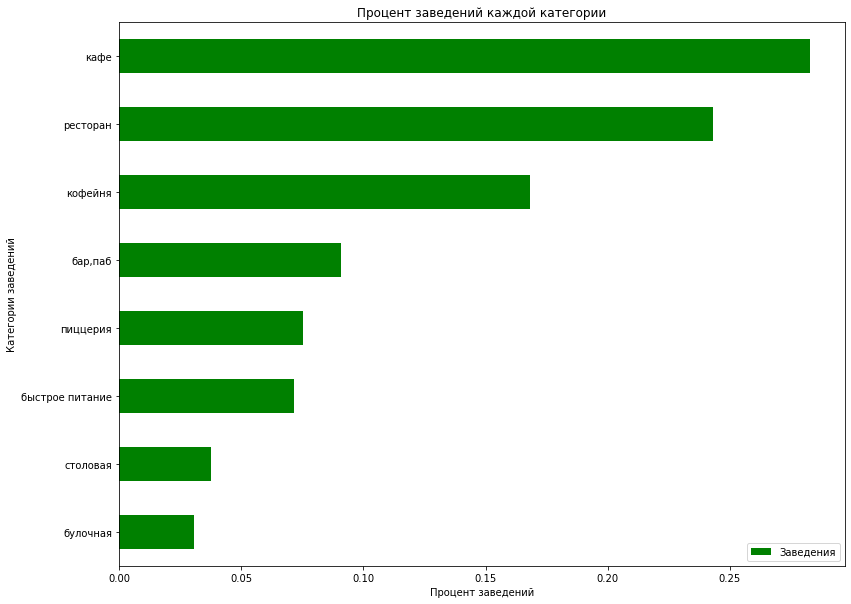

In [30]:
places_category.plot(kind = 'barh', x = 'category', color = 'green', figsize = (13,10))
plt.legend(['Заведения'])
plt.xlabel('Процент заведений')
plt.ylabel('Категории заведений')
plt.title('Процент заведений каждой категории')

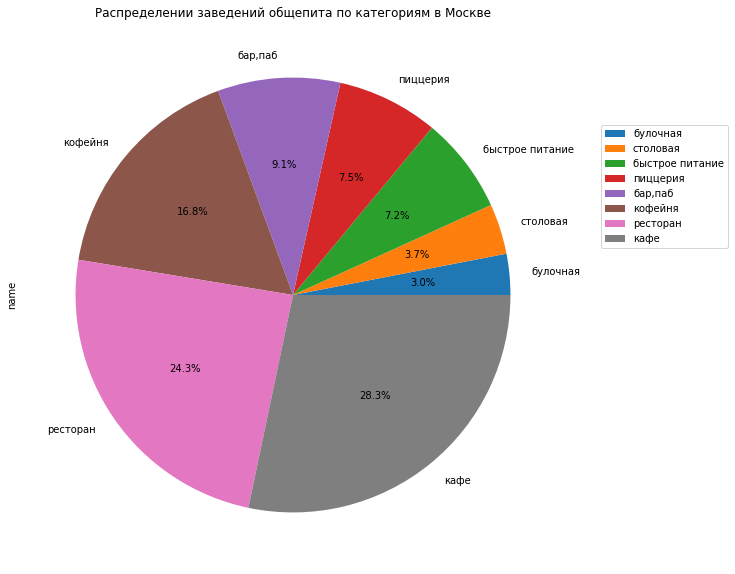

In [31]:
names = places_category['category'].to_list()
places_category.plot(kind = 'pie', figsize = (10,10), y = 'name', labels = names, autopct='%1.1f%%')  
plt.title('Распределении заведений общепита по категориям в Москве')
plt.legend(bbox_to_anchor=( 1.3 , 0.7), loc='center right', borderaxespad= 0 ) 

<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
    
***Вывод:*** 

На данном этапе были проанализированы все представленные в датасете категории заведений общепита Москвы. Для большей наглядности была сформирована визуализация.
    
После анализа можно сделать заключение, что распределение категорий общепитов по распространенности следующее:\
    28,3% - кафе;\
    24,3% - рестораны;\
    16,8% - кофейни;\
    9,1% - бары/пабы;\
    7,5% - пиццерии;\
    7,2% - заведения быстрого питания;\
    3,7% - столовые;\
    3,0% - булочные.

***- Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.***

In [32]:
places_seats_median_mean = places_1.pivot_table (index = 'category', values = 'seats', aggfunc = ['median', 'mean'])\
.reset_index()
places_seats_median_mean.columns = ['category', 'median_seats', 'mean_seats']
places_seats_median_mean

,category,median_seats,mean_seats
0,"бар,паб",82.5,124.532051
1,булочная,50.0,89.385135
2,быстрое питание,65.0,98.891117
3,кафе,60.0,97.512315
4,кофейня,80.0,111.199734
5,пиццерия,55.0,94.496487
6,ресторан,86.0,121.944094
7,столовая,75.5,99.750000


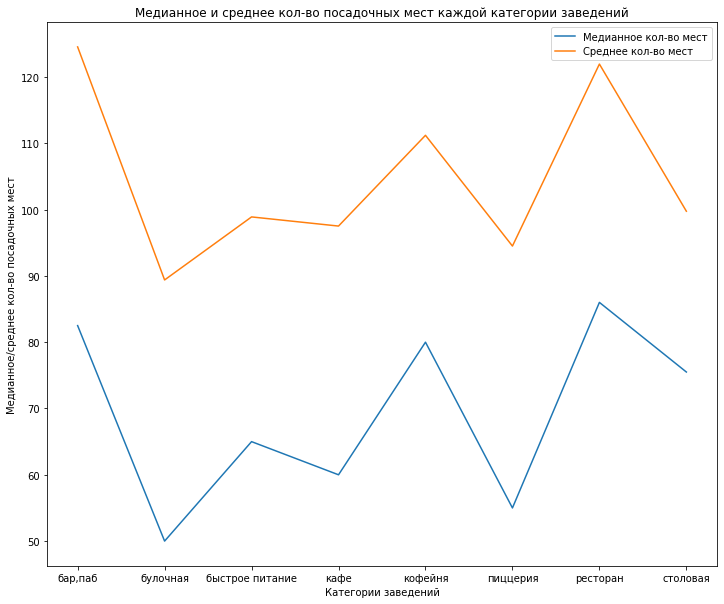

In [33]:
ax = places_seats_median_mean.plot(x = 'category', y = 'median_seats',  figsize = (12,10))
places_seats_median_mean.plot(x = 'category', y = 'mean_seats', ax=ax)
plt.xlabel('Категории заведений')
plt.ylabel('Медианное/среднее кол-во посадочных мест')  
plt.title('Медианное и среднее кол-во посадочных мест каждой категории заведений')
plt.legend(['Медианное кол-во мест', 'Среднее кол-во мест'])

Text(0.5, 1.0, 'Медианное и среднее кол-во посадочных мест каждой категории заведений')

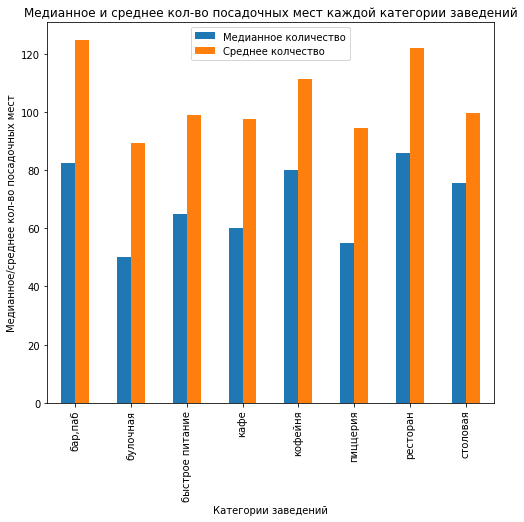

In [36]:
places_seats_median_mean.plot(kind = 'bar', x = 'category', figsize = (8,7))
plt.legend(['Медианное количество', 'Среднее колчество'])
plt.xlabel('Категории заведений')
plt.ylabel('Медианное/среднее кол-во посадочных мест')
plt.title('Медианное и среднее кол-во посадочных мест каждой категории заведений')

<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
    
***Вывод:*** 

На данном этапе были проанализированы количества посадочных мест категорий заведений общепита Москвы. Для большей наглядности была сформирована визуализация.
    
После анализа можно сделать заключение, расчитанные медианные и средние значения посадочных мест разительно отличаются друг от друга внутри каждой категории. 
    
Так, были получены следующие медианные и средние (приведнные к целому) значения соответсвенно: \
бар,паб - 82.5 - 125\
булочная - 50.0	- 89\
быстрое питание	- 65.0 - 99\
кафе - 60.0 - 98\
кофейня	- 80.0 - 111\
пиццерия - 55.0 - 94\
ресторан - 86.0	- 122\
столовая - 75.5 - 100
    
Из полученных данных и визуализации получается, что средние показатели выше, чем медианнные, что не является ошибкой, ведь на первых влияют как аномально высокие, так и низкие показатели (например, если в одном пабе больше посадочных мест, чем в среднем характерно для пабов, когда как в другом пабе мест в разы меньше, чем в среднем для данной категории).
    
Таким образом, беря во внимание описанную ранее особенность средних значений, при необходимости стоит опираться на медианные значения количества посадочных мест для общепита в Москве, так как они в большей степени отражают сложившуюся тенденцию на рынке без аномалий.

***- Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?***

In [37]:
places_chains = places_1.pivot_table (index = 'chain', values = 'name', aggfunc = 'count').reset_index()
places_chains ['name'] = places_chains ['name']/8406
places_chains

,chain,name
0,False,0.618725
1,True,0.381275


Text(0.5, 1.0, 'Соотношение сетевых и несетевых заведений')

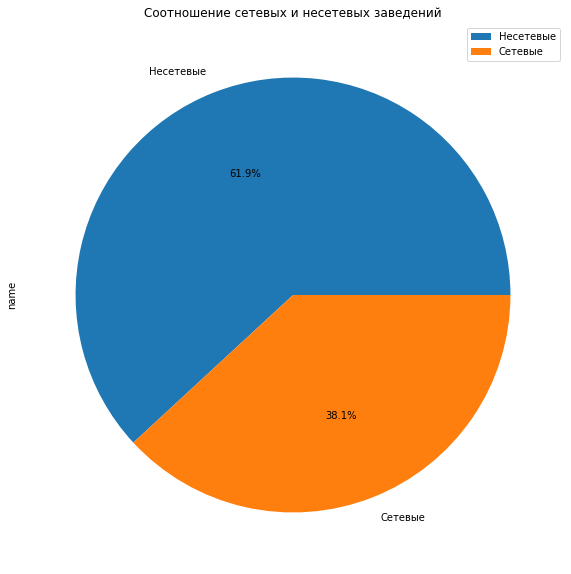

In [38]:
names = ['Несетевые', 'Сетевые']
places_chains.plot(kind = 'pie', figsize = (10,10), subplots=True, labels = names, autopct='%1.1f%%')
plt.title('Соотношение сетевых и несетевых заведений')

<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
    
***Вывод:*** 

На данном этапе было рассмотрено соотношение сетевых и несетевых заведений общепита в Москве. Для большей наглядности была сформирована визуализация.
    
После анализа можно сделать заключение, что большая часть рынка общественного питания Москвы представлена несетевыми заведениями с 61,9% рынка, тогда как сетевые заведения занимают второе место - 38,1% рынка.

***- Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.***

In [39]:
category_chain = places_1.pivot_table (index = 'category', values = 'chain', aggfunc = sum).reset_index()\
.sort_values('chain', ascending = False)
category_chain ['chain'] = category_chain ['chain'] / 3205
category_chain

,category,chain
3,кафе,0.243058
6,ресторан,0.227769
4,кофейня,0.224649
5,пиццерия,0.102964
2,быстрое питание,0.072387
0,"бар,паб",0.052730
1,булочная,0.048986
7,столовая,0.027457


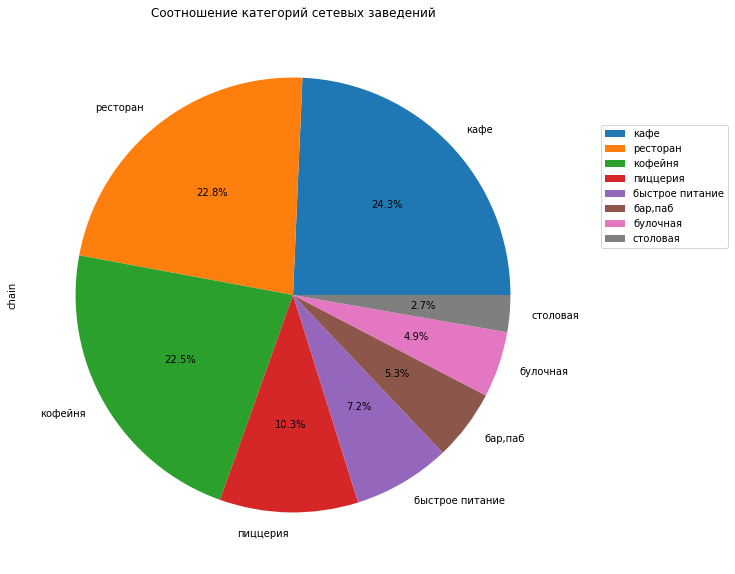

In [40]:
names = category_chain['category'].to_list()
category_chain.plot(kind = 'pie', figsize = (10,10), y = 'chain', labels = names, autopct='%1.1f%%')
plt.title('Соотношение категорий сетевых заведений')
plt.legend(bbox_to_anchor=( 1.3 , 0.7), loc='center right', borderaxespad= 0 ) 

In [41]:
category_chain1 = places_1.pivot_table (index = 'category', values = 'chain', aggfunc = sum).reset_index()\
.sort_values('chain', ascending = False)
category_chain1 ['chain'] = category_chain1 ['chain'] / 8406
category_chain1

,category,chain
3,кафе,0.092672
6,ресторан,0.086843
4,кофейня,0.085653
5,пиццерия,0.039258
2,быстрое питание,0.027599
0,"бар,паб",0.020105
1,булочная,0.018677
7,столовая,0.010469


Text(0, 0.5, 'Категории заведений')

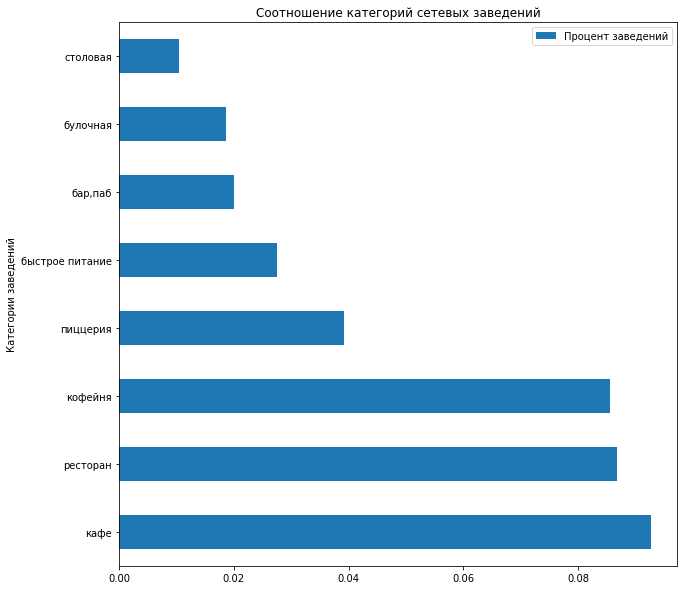

In [42]:
names = category_chain1['category'].to_list()
category_chain1.plot(kind = 'barh', figsize = (10,10), x = 'category')
plt.title('Соотношение категорий сетевых заведений')
plt.legend(bbox_to_anchor=( 1.3 , 0.7), loc = 'center right', borderaxespad = 0)
plt.legend(['Процент заведений'])
#plt.xlabel('')
plt.ylabel('Категории заведений')

<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
    
***Вывод:*** 

На данном этапе было рассмотрено какие категории заведений чаще являются сетевыми. Для большей наглядности была сформирована визуализация.
    
После анализа среди только сетевых заведений можно сделать заключение касательно распределения категорий в таком сегменте:\
кафе - 24,3%\
ресторан - 22,8%\
кофейня - 22,5%\
пиццерия - 10,3%\
быстрое питание	- 7,2%\
бар,паб	- 5,3%\
булочная - 4,9%\
столовая - 2,7%.
    
    
Также, при анализе соотношения сетевых заведений по категориям к общему количеству заведений, можно построить следующее распределение, которое подтверждает порядок, получившийся в выше:\
кафе - 9,3%\
ресторан - 8,7%\
кофейня	- 8,6%\
пиццерия - 3,9%\
быстрое питание	- 2,8%\
бар,паб - 2,0%\
булочная - 1,9%\
столовая - 1,0%.

***- Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?***

In [44]:
name_chain = places_1.pivot_table (index = ['name', 'category'], values = 'chain', aggfunc = sum).reset_index()\
.sort_values(by = 'chain', ascending = False).head(15)
name_chain.columns = ['name', 'category', 'chain_places_number']
name_chain

,name,category,chain_places_number
5943,Шоколадница,кофейня,119
2750,Домино'с Пицца,пиццерия,76
2714,Додо Пицца,пиццерия,74
1214,One Price Coffee,кофейня,71
6019,Яндекс Лавка,ресторан,69
433,Cofix,кофейня,65
1362,Prime,ресторан,49
3011,КОФЕПОРТ,кофейня,42
3529,Кулинарная лавка братьев Караваевых,кафе,39
5141,Теремок,ресторан,36


In [45]:
fig = px.bar (name_chain, x = 'name', y = 'chain_places_number', title = 'Топ-15 популярных сетей в Москве',\
              color='category')
fig.update_layout(xaxis_title = 'Название сети', yaxis_title = 'Количество заведений в сети', legend_title= 'Категории')
fig.show()

<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
    
***Вывод:*** 

На данном этапе были рассмотрены топ-15 популярных сетей общепитов в Москве количество заведений этой сети в регионе. Для большей наглядности была сформирована визуализация.
    
После анализа был получен следующий список самых популярных сетей общепитов с отображением категорий заведений (от наиболее распространенной сети к наименее):
    
1) Шоколадница, кофейня	\
2) Домино'с Пицца, пиццерия	\
3) Додо Пицца, пиццерия	\
4) One Price Coffee, кофейня\
5) Яндекс Лавка, ресторан\
6) Cofix, кофейня\
7) Prime, ресторан\
8) КОФЕПОРТ, кофейня\
9) Кулинарная лавка братьев Караваевых, кафе\
10) Теремок, ресторан\
11) CofeFest, кофейня\
12) Чайхана, кафе\
13) Буханка, булочная\
14) Drive Café, кафе\
15) Кофемания, кофейня
    
Стоит отметить, что распределение категорий в данном пункте отличается от распределения, полученного в предыдущем: это объясняется тем, что в данной части были рассмотрены именно сети как таковые, то есть количество открытых заведений в определенной сети, что и выражается в отличных показателях относительно предыдущего пункта. Так, можно подчеркнуть, что чаще открывают различные сетевые кафе, однако, внутри такой сети количество заведений уступает, например, кофейням. 
    
Также можно выявить некоторые закономерности, беря также во внимание результаты предыдущего пунка:

1) кофейни чаще всего являются самыми многочисленными заведениями внутри одной сети: запустить заведения такой категории сравнительно легче, так как это требует меньших вложений в пространство, разработку меню и т.д., формат кофейни также зачастую подразумевает заказы на вынос, возможность установления невысоких цен на продукцию и большой проходимостью, более того, зачастую они могут открываться под франшизой; стоит отметить, что влияние массовой культуры также способствует распространению и популярности кофеен;
    
2) пиццерии в меньшей степени, но тоже многочисленны внутри одной сети: они также часто открываются под франшизой, однако, требуют больших вложений, чем кофейни, что и обуславливает их меньшее количество;
    
3) ростораны, представленные в настоящем топ-листе ("Яндекс Лавка" и "Prime") не являются типичными представителями данной категории: "Яндекс Лавка" - сервис заказа готовой еды, продуктов и хозяйственных товаров на дом с локальных складов через мобильное приложение или веб-сайт, чья большая покрываемость обуславливается открытием большого числа складов с готовой продукцией (то есть не предусматривает физического потока клиентов); "Prime" - это сеть ресторанов здоровой еды, в основном оруентурующаяся на расположения в бизнес-центрах, в том числе корпоративные форматы, и стрит-ритейл, что в совокупности с франшизой, позволяет выбирать меньшие площади для заведений, следовательно повышать присутсвие в различных частях города;
    
4) кафе, представленные в данном списке, не все представляют возможность франшизы (например, "Кулинарная лавка братьев Караваевых"), однако, их распространенность обуславливается узнаваймостью среди клиентов, что способствует расширению сети; тем не менее, отрытие кафе требует гораздо больших вложений и анализа, что и не позволяет заведениям одной сети открываться часто и в больших количествах;
    
5) формат булочной ("Буханка") является единственным заведением категории в топ-листе: булочные на Московском рынке не распространенный формат заведений, что скорее является следствием отсутсвия данной культуры или тренда на покупку хлебо-булочных изделий в отдельном месте, клиенты скорее предпочтут поход в кофейню; однако, данная категория заведений наиболее распространена и характерна для рынка Санкт-Петербурга, тренды откуда могут влиять на близлежайшие рынки;
    
6) в получившемся списке отсутсвуют такие категории заведений как "столовая", "быстрое питание" и "бар,паб": такого рода заведения зачастую не являются сетевыми (см. Соотношение категорий сетевых заведений) или реже представлены в Москве.

***- Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.***

In [46]:
places_1['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [47]:
def district_abriv (district):
    if district == 'Северный административный округ':
        return 'САО'
    if district == 'Северо-Восточный административный округ': 
        return 'СВАО'
    if district == 'Северо-Западный административный округ': 
        return 'СЗАО'
    if district == 'Западный административный округ': 
        return 'ЗАО'
    if district == 'Центральный административный округ': 
        return 'ЦАО'
    if district == 'Восточный административный округ': 
        return 'ВАО'
    if district == 'Юго-Восточный административный округ': 
        return 'ЮВАО'
    if district == 'Южный административный округ': 
        return 'ЮАО'
    if district == 'Юго-Западный административный округ':
        return 'ЮЗАО'

    
    
district_abriv ('Южный административный округ')    

'ЮАО'

In [48]:
places_1['district_abr'] = places_1['district'].apply(district_abriv)

In [49]:
places_1['district_abr'].unique()

array(['САО', 'СВАО', 'СЗАО', 'ЗАО', 'ЦАО', 'ВАО', 'ЮВАО', 'ЮАО', 'ЮЗАО'],
      dtype=object)

In [50]:
category_district1 = places_1.pivot_table (index = 'district', values = 'name', aggfunc = 'count').reset_index()\
.sort_values(by = 'name', ascending = False)

category_district1 ['portion'] = (category_district1 ['name']/8406)*100
category_district1

,district,name,portion
5,Центральный административный округ,2242,26.671425
2,Северный административный округ,900,10.706638
8,Южный административный округ,892,10.611468
3,Северо-Восточный административный округ,891,10.599572
1,Западный административный округ,851,10.123721
0,Восточный административный округ,798,9.493219
6,Юго-Восточный административный округ,714,8.493933
7,Юго-Западный административный округ,709,8.434452
4,Северо-Западный административный округ,409,4.865572


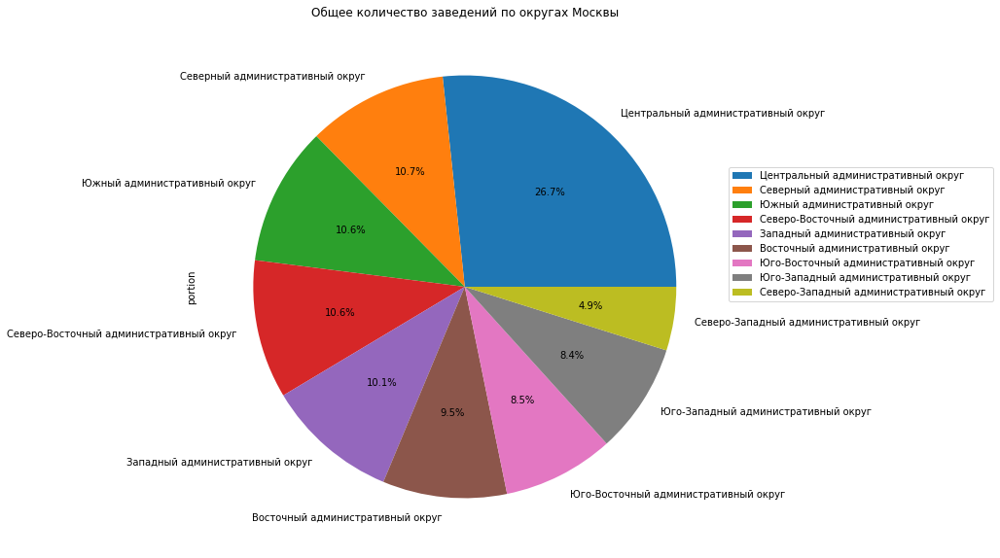

In [51]:
names = category_district1['district'].to_list()
category_district1.plot(kind = 'pie', figsize = (10,10), y = 'portion', labels = names, autopct='%1.1f%%')
plt.title('Общее количество заведений по округах Москвы')
plt.legend(bbox_to_anchor=( 1.5, 0.6), loc='center right', borderaxespad= 0 ) 

In [52]:
category_district = places_1.pivot_table (index = ['district_abr', 'category'], values = 'name', aggfunc = 'count'\
                                         ).reset_index().sort_values(by = 'name', ascending = False)
category_district.columns = ['district_abr', 'category', 'places_number']
category_district

,district_abr,category,places_number
46,ЦАО,ресторан,670
43,ЦАО,кафе,464
44,ЦАО,кофейня,428
40,ЦАО,"бар,паб",364
59,ЮВАО,кафе,282
...,...,...,...
32,СЗАО,"бар,паб",23
39,СЗАО,столовая,18
71,ЮЗАО,столовая,17
57,ЮВАО,булочная,13


In [53]:
fig = px.bar(
    category_district,
    x = 'district_abr', y = 'places_number', color = 'category',\
    title = 'Распределение заведений каждой категории по районам Москвы', barmode = 'group')
fig.update_layout(xaxis_title = 'Административный район', yaxis_title = 'Количество заведений', legend_title= 'Категории')
fig.show()

<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
    
***Вывод:*** 

На данном этапе были рассмотрены административные районы Москвы, общее количество заведений в них и количество заведений каждой категории по районам. Для большей наглядности была сформирована визуализация.
    
После анализа был получен рейтинг административных районов Москвы по количеству заведений расположеных в них (от самого популярного к наименее популярному): 
    
1) Центральный административный округ (ЦАО) - 26,7%\
2) Северный административный округ (САО) - 10.7%\
3) Южный административный округ (ЮАО) - 10.6%\
4) Северо-Восточный административный округ (СВАО) - 10.6%\
5) Западный административный округ (ЗАО) - 10.1%\
6) Восточный административный округ (ВАО) - 9.5%\
7) Юго-Восточный административный округ (ЮВАО) - 8,5%\
8) Юго-Западный административный округ (ЮЗАО) - 8.4%\
9) Северо-Западный административный округ (СЗАО) - 4.9%\
    
Таким образом, можно сделать заключение, что лидером среди административных районов Москвы стал Центральный Административный округ (ЦАО), стоит также отметить особенность данного округа - лидирующую позицию по количуству заведений занимает категория "ресторан", что не характерно для остальных районов Москвы. Более того, в остальных округах Москвы наиболее популярная категория заведений - "кафе". Округ наиболее "неосвоенный" общепитом является Северо-Западный административный округ (СЗАО) - на него приходятся 4,9% всех заведений Москвы, в остальных же округах количество скорее одинаковое - разница колеблится в пределах 2,3%.

***- Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?***

In [54]:
category_rating_median_mean = places_1.pivot_table (index = 'category', values = 'rating',\
                                                    aggfunc = ['median', 'mean']).reset_index()
category_rating_median_mean.columns = ['category', 'median_rating', 'mean_rating']
category_rating_median_mean

,category,median_rating,mean_rating
0,"бар,паб",4.4,4.387712
1,булочная,4.3,4.268359
2,быстрое питание,4.2,4.050249
3,кафе,4.2,4.123886
4,кофейня,4.3,4.277282
5,пиццерия,4.3,4.301264
6,ресторан,4.3,4.290357
7,столовая,4.3,4.211429


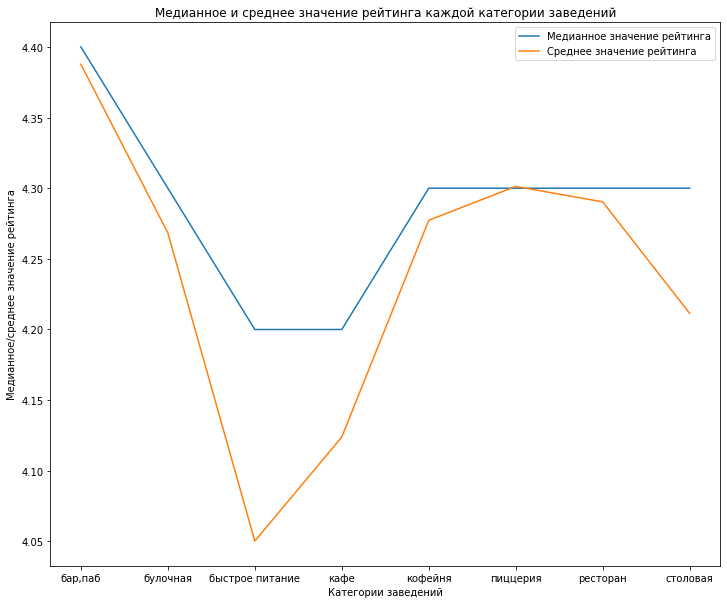

In [55]:
ax = category_rating_median_mean.plot(x = 'category', y = 'median_rating',  figsize = (12,10))
category_rating_median_mean.plot(x = 'category', y = 'mean_rating', ax=ax)
plt.xlabel('Категории заведений')
plt.ylabel('Медианное/среднее значение рейтинга')  
plt.title('Медианное и среднее значение рейтинга каждой категории заведений')
plt.legend(['Медианное значение рейтинга', 'Среднее значение рейтинга'])

In [56]:
plt.figure (figsize = (10,10))
fig = px.bar (category_rating_median_mean, x = 'category', y = ['median_rating', 'mean_rating'],\
              title = 'Медианные и средние рейтинги заведений по категориям', barmode = 'group')
fig.update_xaxes (tickangle = 45)
fig.update_layout(xaxis_title = 'Название категории', yaxis_title = 'Медианный / средний рейтинг', legend_title= 'Рейтинги')
fig.show()

<Figure size 720x720 with 0 Axes>

In [57]:
# Код ревьюера

px.box(places_1, x="category", y="rating")

<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
    
***Вывод:*** 

На данном этапе были рассмотрены распределение медианных и средних рейтингов по категориям заведений. Для большей наглядности была сформирована визуализация.
    
После анализа можно сделать вывод, что средние (наиболее подвергающиеся частным случаям) и медианные значения (наиболее устойчивые к частным случаям) рейтингов по категориям заведений практически одинаковые, что может являться признаком отсутствия каких-либо аномальных показателей в данных. Однако, стоит отметить, что при сопоставлении средних показателей рейтинга между категориями заведений прослеживается тенденция - категория "быстрое питание" в среднем получила самые низкие оценки рейтинга. Данный факт можно объяснить тем, что "бистро" зачастую подвергаются большей критики со стороны клиентов (нежели остальные категории заведений), так как не всегда способны на уровне удержать соотношение цены/качество, время готовности блюд и другие показатели/требования, которые к ним прменяются.

***- Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).***

In [58]:
#with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    #geo_json = json.load(f)

In [59]:
rating_df = places_1.groupby('district', as_index = False)['rating'].agg('mean')
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map (location = [moscow_lat, moscow_lng], zoom_start = 10, tiles = 'Cartodb Positron')
Choropleth (geo_data = state_geo, 
           data = rating_df,
           columns = ['district', 'rating'],
           key_on = 'feature.name',
           fill_color = 'YlGn',
           fill_opacity = 0.8,
           legend_name = 'Средний рейтинг заведений по районам Москвы').add_to (m)
m

<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
    
***Вывод:*** 
    
На данном этапе была построена фоновую картограмму (хороплет) со средним рейтингом заведений каждого района Москвы для большей наглядности.

***- Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.***

In [60]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map (location = [moscow_lat, moscow_lng], zoom_start = 10, tiles = 'Cartodb Positron')
marker_cluster = MarkerCluster().add_to(m)
def create_cluster(row):
    Marker(
        [row['lat'], row ['lng']],
        popup = f"{row['name']}{row['rating']}",
    ).add_to(marker_cluster)
places_1.apply(create_cluster, axis = 1)
m

<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
    
***Вывод:*** 
    
На данном этапе были отображены все заведения датасета на карте Москвы для большей наглядности.

***- Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.***

In [61]:
top_streets = places_1.pivot_table (index = 'street', values = 'chain', aggfunc = 'count').reset_index()\
.sort_values(by = 'chain', ascending = False).head(15)
top_streets ['portion'] = (top_streets['chain']/8406)*100
top_streets.columns = ['street', 'places_number', 'portion']
top_streets

,street,places_number,portion
1090,проспект Мира,184,2.188913
773,Профсоюзная улица,122,1.451344
1087,проспект Вернадского,108,1.284797
525,Ленинский проспект,107,1.272900
523,Ленинградский проспект,95,1.130145
373,Дмитровское шоссе,88,1.046871
455,Каширское шоссе,77,0.916012
298,Варшавское шоссе,76,0.904116
524,Ленинградское шоссе,70,0.832739
550,МКАД,65,0.773257


In [62]:
top_streets2 = top_streets ['street'].to_list()
top_streets3 = places_1.query ('street == @top_streets2').groupby (['street', 'category'], as_index = False)['name']\
.count().sort_values (by = 'name', ascending = False)
top_streets3.columns = ['street', 'category', 'places_number']
top_streets3

,street,category,places_number
93,проспект Мира,кафе,53
63,МКАД,кафе,45
96,проспект Мира,ресторан,45
94,проспект Мира,кофейня,36
70,Профсоюзная улица,кафе,35
...,...,...,...
58,Люблинская улица,пиццерия,1
83,проспект Вернадского,булочная,1
23,Кутузовский проспект,булочная,1
66,МКАД,столовая,1


In [63]:
plt.figure (figsize = (15,18))
fig = px.bar(
    top_streets3,
    x = 'street', y = 'places_number', color = 'category',\
    title = 'Распределение заведений каждой категории по топ-15 улицам Москвы', barmode = 'group')
fig.update_layout(xaxis_title = 'Улицы', yaxis_title = 'Количество заведений', legend_title= 'Категории')
fig.show()

<Figure size 1080x1296 with 0 Axes>

<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
    
***Вывод:*** 

На данном этапе были рассмотрены топ-15 улиц по количеству заведений и их категорий по этим улицам. Для большей наглядности была сформирована визуализация.
    
После анализа был получен топ-лист с нименованиями улиц и их долей от общего числа заведений общепита Москвы (от наиболее популярной к наименее популярной):
    
1) проспект Мира - 2.19%\
2) Профсоюзная улица - 1.45%\
3) проспект Вернадского	- 1.28%\
4) Ленинский проспект - 1.27%\
5) Ленинградский проспект - 1.13%\
6) Дмитровское шоссе - 1.05%\
7) Каширское шоссе - 0.92%\
8) Варшавское шоссе - 0.90%\
9) Ленинградское шоссе - 0.83%\
10) МКАД - 0.77%\
11) Люблинская улица - 0.71%\
12) улица Вавилова - 0.65%\
13) Кутузовский проспект - 0.64%\
14) улица Миклухо-Маклая - 0.58%\
15) Пятницкая улица 0.57%\
    
Таким образом, можно сделать вывод, что наиболее популярной улицей является "Проспект мира" с долей в 2,19% от числа всех заведений общественного питания Москвы, с лидирующей на ней категорией - "кафе". Стоит также отметить, что категория "кафе" является одной из самых распространенных на всех топ-15 улицах совместно с категорией "ресторан".

***- Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?***

In [64]:
street_only_one = places_1.pivot_table (index = 'street', values = 'chain', aggfunc = 'count').reset_index()
street_only_one = street_only_one.query ('chain == 1')
street_only_one

,street,chain
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1436,улица Шкулёва,1
1437,улица Шкулёва 4,1
1439,улица Шухова,1
1442,улица Юннатов,1


In [65]:
len(places_1['street'].unique())

1448

In [66]:
street_only_one_list = street_only_one['street'].to_list()
street_only_one_info = places_1.query('street == @street_only_one_list')
street_only_one_info

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,district_abr
15,Дом обеда,столовая,"[Москва, улица Бусиновская Горка, 2]",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,False,180.0,улица Бусиновская Горка,False,САО
21,7/12,кафе,"[Москва, Прибрежный проезд, 7]",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,False,NaN,Прибрежный проезд,False,САО
25,В парке вкуснее,кофейня,"[Москва, парк Левобережный]",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,True,NaN,парк Левобережный,False,САО
58,Coffeekaldi's,кофейня,"[Москва, Угличская улица, 13, стр. 8]",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,True,NaN,Угличская улица,False,СВАО
60,Чебуречная история,кофейня,"[Москва, ландшафтный заказник Лианозовский]",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,True,NaN,ландшафтный заказник Лианозовский,False,СВАО
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,Мираж,ресторан,"[Москва, улица Шкулёва, 2А]",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,False,90.0,улица Шкулёва,False,ЮВАО
8294,WTFcoffee,кофейня,"[Москва, улица Артюхиной, 14/8с1]",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,False,NaN,улица Артюхиной,False,ЮВАО
8317,Беседка,кафе,"[Москва, Кузьминская улица, 10]",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,True,NaN,Кузьминская улица,False,ЮВАО
8379,Лагман Хаус,кафе,"[Москва, Новороссийская улица, 14, стр. 2]",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,True,40.0,Новороссийская улица,False,ЮВАО


In [67]:
street_only_one_category = street_only_one_info.pivot_table(index = 'category', values = 'name', aggfunc = 'count')\
.reset_index().sort_values(by = 'name', ascending = False)
street_only_one_category ['portion'] = (street_only_one_category ['name']/8406)*100
street_only_one_category

,category,name,portion
3,кафе,160,1.903402
6,ресторан,93,1.106353
4,кофейня,84,0.999286
0,"бар,паб",39,0.463954
7,столовая,36,0.428266
2,быстрое питание,23,0.273614
5,пиццерия,15,0.178444
1,булочная,8,0.095170


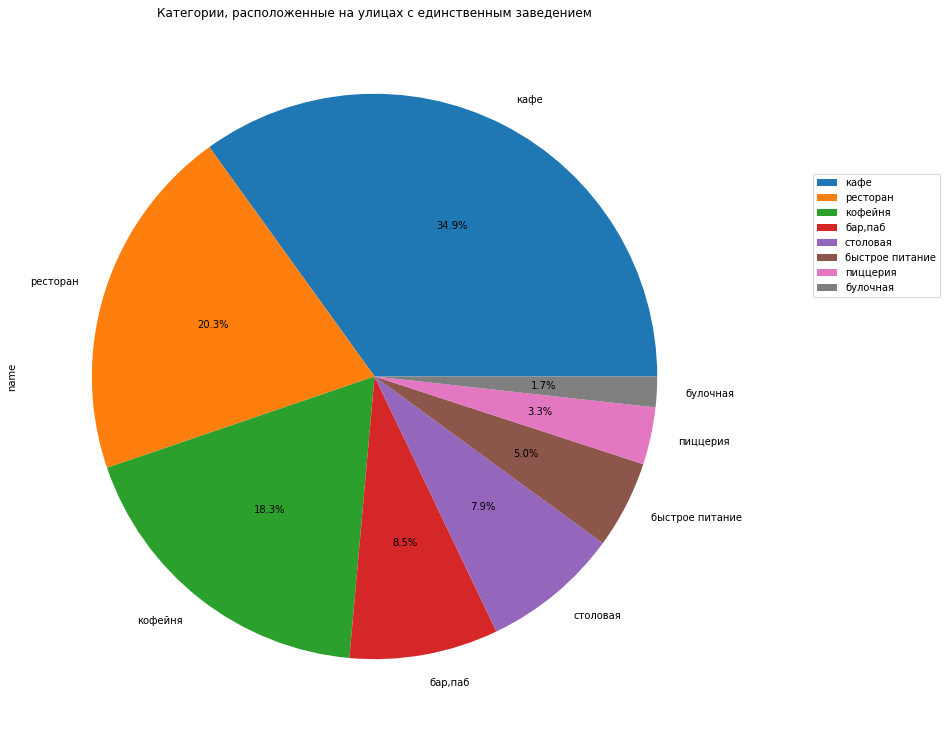

In [68]:
names = street_only_one_category['category'].to_list()
street_only_one_category.plot(kind = 'pie', figsize = (13,13), y = 'name', labels = names, autopct='%1.1f%%')
plt.title('Категории, расположенные на улицах с единственным заведением')
plt.legend(bbox_to_anchor=( 1.3 , 0.7), loc='center right', borderaxespad= 0 ) 

In [69]:
street_only_one_rating = street_only_one_info.pivot_table(index = ['rating', 'category'], values = 'name', \
                                                          aggfunc = 'count').reset_index().sort_values(by = 'name')

In [70]:
plt.figure (figsize = (10,10))
fig = px.bar (street_only_one_rating, x = 'rating', y = 'name', color = 'category', \
              title = 'Средние рейтинги заведений по категориям')
#fig.update_xaxes (tickangle = 10)
fig.update_layout(xaxis_title = 'Название категории', yaxis_title = 'Средний рейтинг')
fig.show()

<Figure size 720x720 with 0 Axes>

<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">

***Вывод:*** 

На данном этапе были рассмотрены улицы Москвы, на которых находится только один объект общепита. Для большей наглядности была сформирована визуализация.
    
После анализа было получено, что таких улиц в датасете 458 штук, что составляет 5,45% от всех улиц, представленных в датасете. Также были рассмотрены категории заведений, встречающиеся на таких улицах (от наиболее распространенных до наименее распространенных):

1) кафе	- 160 (заведений) - 1.90% (от общего числа)\
2) ресторан	- 93 (заведений) - 1.11% (от общего числа)\
3) кофейня - 84	(заведений) - 1.00% (от общего числа)\
4) бар,паб - 39 (заведений) - 0.46% (от общего числа)\
5) столовая - 36 (заведений) - 0.43% (от общего числа)\
6) быстрое питание - 23 (заведений) - 0.27% (от общего числа)\
7) пиццерия - 15 (заведений) - 0.18% (от общего числа)\
8) булочная - 8 (заведений) - 0.10% (от общего числа)

Наиболее распространенная категории заведений на таких улицах - "кафе" или "ресторан": объяснением данного факта с большей долей вероятности является удаленность таких улиц от транспортных узлов или центра города (где большая проходимость и центр притяжения), поэтому ориентация в таких местах идет больше на семейные заведения. Средний рейтинг таких заведений в большей мере находится в диапозоне от 4.0 до 4.5, а наиболее часто ценивают кафе, рестораны и кофейни.

***- Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?***

In [71]:
avg_bill = places_1.pivot_table (index = 'district', values = 'middle_avg_bill', aggfunc = 'median').reset_index()\
.sort_values (by = 'middle_avg_bill', ascending = False)
avg_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [72]:
#rating_df = places_1.groupby('district', as_index = False)['rating'].agg('mean')
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map (location = [moscow_lat, moscow_lng], zoom_start = 10, tiles = 'Cartodb Positron')
Choropleth (geo_data = state_geo, 
           data = avg_bill,
           columns = ['district', 'middle_avg_bill'],
           key_on = 'feature.name',
           fill_color = 'YlGn',
           fill_opacity = 0.8,
           legend_name = 'Медианные значения средних чеков заведенийпо районам Москвы').add_to (m)
m

<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">

__Вывод:__

На данном этапе были рассмотрены значения средних чеков заведений. Для большей наглядности была построена фоновая картограмма (хороплет).

После анализа медианныых значений средних чеков заведений было получено следующее распределение по округам Москвы (от наиболее дорогого к наиболее дешевому): 

1 - Западный административный округ - 1000.0\
2 - Центральный административный округ - 1000.0\
3 - Северо-Западный административный округ - 700.0\
4 - Северный административный округ - 650.0\
5 - Юго-Западный административный округ - 600.0\
6 - Восточный административный округ - 575.0\
7 - Северо-Восточный административный округ - 500.0\
8 - Южный административный округ - 500.0\
9 - Юго-Восточный административный округ - 450.0

Таким образом, заведения общественного питания с наибольшей средней ценой распологаются в Западном и Центральном административных округах, из чего следует, что приблеженность к центру города прямо влияет на уровень цен в заведениях общественного питания. Однако, следует также отметить, что и престижность округа города в равной степени влияет на ценообразование (чем спрестижнее округ, тем выше цены). Подтверждение тому тот факт, что Западный административный округ исторически считается одним из самых престижных и респектабельных в Москве, и уровень цен в нем, как и в Центральном округе, находится на одном уровне.

***Вывод по части:*** 

На данном шаге по исследовательскому анализу данных были рассмотрены 12 (двенадцать) вопросов, которые в дальнейшем будут являться базой для ответа на поставленную задачу проекта. 

Изначально при анализе всех представленных в датасете категорий заведений общепита Москвы можно сделать заключение, что распределение категорий общепитов по распространенности следующее:\
    28,3% - кафе;\
    24,3% - рестораны;\
    16,8% - кофейни;\
    9,1% - бары/пабы;\
    7,5% - пиццерии;\
    7,2% - заведения быстрого питания;\
    3,7% - столовые;\
    3,0% - булочные.
    
После обработки количества посадочных мест категорий заведений общепита Москвы можно сделать заключение, что расчитанные медианные и средние значения посадочных мест разительно отличаются друг от друга внутри каждой категории. Так, были получены следующие медианные и средние (приведнные к целому) значения соответсвенно: \
бар,паб - 82.5 - 125\
булочная - 50.0	- 89\
быстрое питание	- 65.0 - 99\
кафе - 60.0 - 98\
кофейня	- 80.0 - 111\
пиццерия - 55.0 - 94\
ресторан - 86.0	- 122\
столовая - 75.5 - 100.
    
Из полученных данных получается, что средние показатели выше, чем медианнные, что не является ошибкой, ведь на первых влияют как аномально высокие, так и низкие показатели (например, если в одном пабе больше посадочных мест, чем в среднем характерно для пабов, когда как в другом пабе мест в разы меньше, чем в среднем для данной категории). Таким образом, беря во внимание описанную ранее особенность средних значений, при необходимости стоит опираться на медианные значения количества посадочных мест для общепита в Москве, так как они в большей степени отражают сложившуюся тенденцию на рынке без аномалий.

Рассматривая соотношения сетевых и несетевых заведений общепита в Москве было сделано заключение, что большая часть рынка общественного питания Москвы представлена несетевыми заведениями с 61,9% рынка, тогда как сетевые заведения занимают второе место - 38,1% рынка. Далее было найдено распределение категорий заведений в сетевом сегменте:\
кафе - 24,3%\
ресторан - 22,8%\
кофейня - 22,5%\
пиццерия - 10,3%\
быстрое питание	- 7,2%\
бар,паб	- 5,3%\
булочная - 4,9%\
столовая - 2,7%.

После анализа топ-15 популярных сетей общепитов в Москве количество заведений этой сети в регионе был получен следующий список самых популярных сетей общепитов с отображением категорий заведений (от наиболее распространенной сети к наименее):

1) Шоколадница, кофейня\
2) Домино'с Пицца, пиццерия\
3) Додо Пицца, пиццерия\
4) One Price Coffee, кофейня\
5) Яндекс Лавка, ресторан\
6) Cofix, кофейня\
7) Prime, ресторан\
8) КОФЕПОРТ, кофейня\
9) Кулинарная лавка братьев Караваевых, кафе\
10) Теремок, ресторан\
11) CofeFest, кофейня\
12) Чайхана, кафе\
13) Буханка, булочная\
14) Drive Café, кафе\
15) Кофемания, кофейня

Стоит отметить, что распределение категорий в данном пункте отличается от распределения, полученного в предыдущем: это объясняется тем, что в данной части были рассмотрены именно сети как таковые, то есть количество открытых заведений в определенной сети, что и выражается в отличных показателях относительно предыдущего пункта. Так, можно подчеркнуть, что чаще открывают различные сетевые кафе, однако, внутри такой сети количество заведений уступает, например, кофейням.

Также можно выявить некоторые закономерности, беря также во внимание результаты предыдущего пунка:

1) кофейни чаще всего являются самыми многочисленными заведениями внутри одной сети: запустить заведения такой категории сравнительно легче, так как это требует меньших вложений в пространство, разработку меню и т.д., формат кофейни также зачастую подразумевает заказы на вынос, возможность установления невысоких цен на продукцию и большой проходимостью, более того, зачастую они могут открываться под франшизой; стоит отметить, что влияние массовой культуры также способствует распространению и популярности кофеен;

2) пиццерии в меньшей степени, но тоже многочисленны внутри одной сети: они также часто открываются под франшизой, однако, требуют больших вложений, чем кофейни, что и обуславливает их меньшее количество;

3) ростораны, представленные в настоящем топ-листе ("Яндекс Лавка" и "Prime") не являются типичными представителями данной категории: "Яндекс Лавка" - сервис заказа готовой еды, продуктов и хозяйственных товаров на дом с локальных складов через мобильное приложение или веб-сайт, чья большая покрываемость обуславливается открытием большого числа складов с готовой продукцией (то есть не предусматривает физического потока клиентов); "Prime" - это сеть ресторанов здоровой еды, в основном оруентурующаяся на расположения в бизнес-центрах, в том числе корпоративные форматы, и стрит-ритейл, что в совокупности с франшизой, позволяет выбирать меньшие площади для заведений, следовательно повышать присутсвие в различных частях города;

4) кафе, представленные в данном списке, не все представляют возможность франшизы (например, "Кулинарная лавка братьев Караваевых"), однако, их распространенность обуславливается узнаваймостью среди клиентов, что способствует расширению сети; тем не менее, отрытие кафе требует гораздо больших вложений и анализа, что и не позволяет заведениям одной сети открываться часто и в больших количествах;

5) формат булочной ("Буханка") является единственным заведением категории в топ-листе: булочные на Московском рынке не распространенный формат заведений, что скорее является следствием отсутсвия данной культуры или тренда на покупку хлебо-булочных изделий в отдельном месте, клиенты скорее предпочтут поход в кофейню; однако, данная категория заведений наиболее распространена и характерна для рынка Санкт-Петербурга, тренды откуда могут влиять на близлежайшие рынки;

6) в получившемся списке отсутсвуют такие категории заведений как "столовая", "быстрое питание" и "бар,паб": такого рода заведения зачастую не являются сетевыми (см. Соотношение категорий сетевых заведений) или реже представлены в Москве.



Также были рассмотрены административные районы Москвы, общее количество заведений в них и количество заведений каждой категории по районам. После анализа был получен рейтинг административных районов Москвы по количеству заведений расположеных в них (от самого популярного к наименее популярному): 
    
1) Центральный административный округ (ЦАО) - 26,7%\
2) Северный административный округ (САО) - 10.7%\
3) Южный административный округ (ЮАО) - 10.6%\
4) Северо-Восточный административный округ (СВАО) - 10.6%\
5) Западный административный округ (ЗАО) - 10.1%\
6) Восточный административный округ (ВАО) - 9.5%\
7) Юго-Восточный административный округ (ЮВАО) - 8,5%\
8) Юго-Западный административный округ (ЮЗАО) - 8.4%\
9) Северо-Западный административный округ (СЗАО) - 4.9%\
    
Таким образом, можно сделать заключение, что лидером среди административных районов Москвы стал Центральный Административный округ (ЦАО), стоит также отметить особенность данного округа - лидирующую позицию по количуству заведений занимает категория "ресторан", что не характерно для остальных районов Москвы. Более того, в остальных округах Москвы наиболее популярная категория заведений - "кафе". Округ наиболее "неосвоенный" общепитом является Северо-Западный административный округ (СЗАО) - на него приходятся 4,9% всех заведений Москвы, в остальных же округах количество скорее одинаковое - разница колеблится в пределах 2,3%.

После анализа распределение медианных и средних рейтингов по категориям заведений был сделан вывод, что средние (наиболее подвергающиеся частным случаям) и медианные значения (наиболее устойчивые к частным случаям) рейтингов по категориям заведений практически одинаковые, что может являться признаком отсутствия каких-либо аномальных показателей в данных. Однако, стоит отметить, что при сопоставлении средних показателей рейтинга между категориями заведений прослеживается тенденция - категория "быстрое питание" в среднем получила самые низкие оценки рейтинга. Данный факт можно объяснить тем, что "бистро" зачастую подвергаются большей критики со стороны клиентов (нежели остальные категории заведений), так как не всегда способны на уровне удержать соотношение цены/качество, время готовности блюд и другие показатели/требования, которые к ним прменяются.

Был получен список топ-15 улиц и их долей от общего числа заведений общепита Москвы (от наиболее популярной к наименее популярной):

1) проспект Мира - 2.19%\
2) Профсоюзная улица - 1.45%\
3) проспект Вернадского - 1.28%\
4) Ленинский проспект - 1.27%\
5) Ленинградский проспект - 1.13%\
6) Дмитровское шоссе - 1.05%\
7) Каширское шоссе - 0.92%\
8) Варшавское шоссе - 0.90%\
9) Ленинградское шоссе - 0.83%\
10) МКАД - 0.77%\
11) Люблинская улица - 0.71%\
12) улица Вавилова - 0.65%\
13) Кутузовский проспект - 0.64%\
14) улица Миклухо-Маклая - 0.58%\
15) Пятницкая улица 0.57%

Таким образом, можно сделать вывод, что наиболее популярной улицей является "Проспект мира" с долей в 2,19% от числа всех заведений общественного питания Москвы, с лидирующей на ней категорией - "кафе". Стоит также отметить, что категория "кафе" является одной из самых распространенных на всех топ-15 улицах совместно с категорией "ресторан".

Также были рассмотрены улицы Москвы, на которых находится только один объект общепита. После анализа было получено, что таких улиц в датасете 458 штук, что составляет 5,45% от всех улиц, представленных в датасете. Также были рассмотрены категории заведений, встречающиеся на таких улицах (от наиболее распространенных до наименее распространенных):

1) кафе	- 160 (заведений) - 1.90% (от общего числа)\
2) ресторан	- 93 (заведений) - 1.11% (от общего числа)\
3) кофейня - 84	(заведений) - 1.00% (от общего числа)\
4) бар,паб - 39 (заведений) - 0.46% (от общего числа)\
5) столовая - 36 (заведений) - 0.43% (от общего числа)\
6) быстрое питание - 23 (заведений) - 0.27% (от общего числа)\
7) пиццерия - 15 (заведений) - 0.18% (от общего числа)\
8) булочная - 8 (заведений) - 0.10% (от общего числа)

Наиболее распространенная категории заведений на таких улицах - "кафе" или "ресторан": объяснением данного факта с большей долей вероятности является удаленность таких улиц от транспортных узлов или центра города (где большая проходимость и центр притяжения), поэтому ориентация в таких местах идет больше на семейные заведения. Средний рейтинг таких заведений в большей мере находится в диапозоне от 4.0 до 4.5, а наиболее часто ценивают кафе, рестораны и кофейни.

В заключение данного шага работы над проектом были рассмотрены значения средних чеков заведений, а для большей наглядности была построена фоновая картограмма (хороплет). После анализа медианныых значений средних чеков заведений было получено следующее распределение по округам Москвы (от наиболее дорогого к наиболее дешевому): 

1 - Западный административный округ - 1000.0\
2 - Центральный административный округ - 1000.0\
3 - Северо-Западный административный округ - 700.0\
4 - Северный административный округ - 650.0\
5 - Юго-Западный административный округ - 600.0\
6 - Восточный административный округ - 575.0\
7 - Северо-Восточный административный округ - 500.0\
8 - Южный административный округ - 500.0\
9 - Юго-Восточный административный округ - 450.0

Таким образом, заведения общественного питания с наибольшей средней ценой распологаются в Западном и Центральном административных округах, из чего следует, что приблеженность к центру города прямо влияет на уровень цен в заведениях общественного питания. Однако, следует также отметить, что и престижность округа города в равной степени влияет на ценообразование (чем спрестижнее округ, тем выше цены). Подтверждение тому тот факт, что Западный административный округ исторически считается одним из самых престижных и респектабельных в Москве, и уровень цен в нем, как и в Центральном округе, находится на одном уровне.

Стоит также отметить, что была построена фоновую картограмму (хороплет) со средним рейтингом заведений каждого района Москвы, а также были отображены все заведения датасета на карте Москвы.

# Шаг 4. Детализация исследования: открытие кофейни.
<a id="end"></a>

***- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?***


In [73]:
(len(places_1.query('category == "кофейня"'))/8406)*100

16.809421841541756

In [74]:
cofeynia = places_1.query('category == "кофейня"').groupby('district', as_index=False)['name'].count()\
.sort_values (by = 'name', ascending = False)
cofeynia ['portion'] = (cofeynia ['name']/1413)*100
cofeynia

,district,name,portion
5,Центральный административный округ,428,30.290163
2,Северный административный округ,193,13.658882
3,Северо-Восточный административный округ,159,11.252654
1,Западный административный округ,150,10.615711
8,Южный административный округ,131,9.271054
0,Восточный административный округ,105,7.430998
7,Юго-Западный административный округ,96,6.794055
6,Юго-Восточный административный округ,89,6.298655
4,Северо-Западный административный округ,62,4.387827


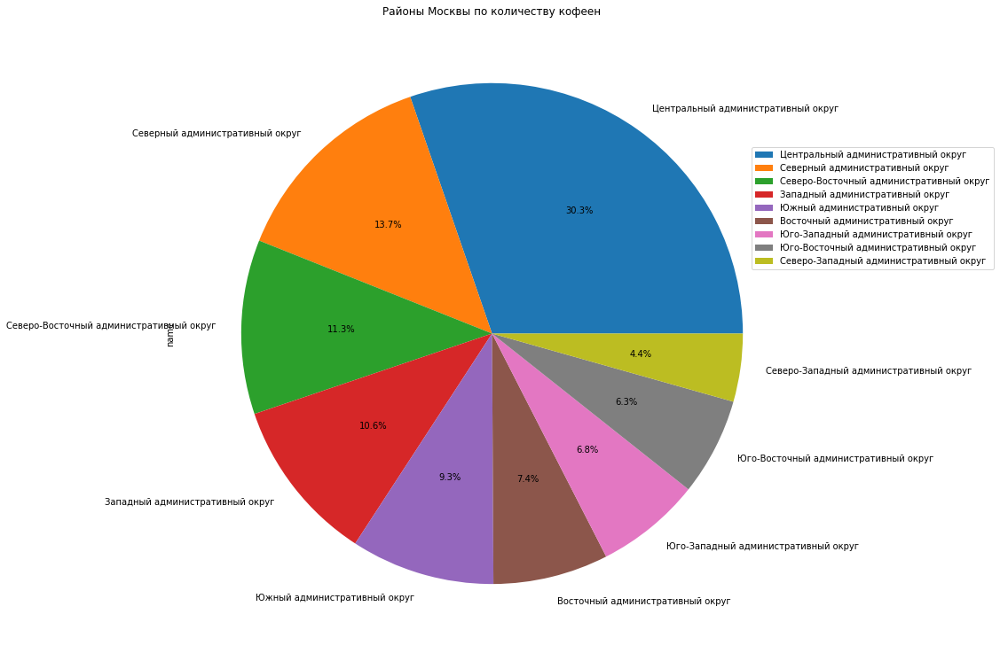

In [75]:
names = cofeynia['district'].to_list()
cofeynia.plot(kind = 'pie', figsize = (13,13), y = 'name', labels = names, autopct='%1.1f%%')
plt.title('Районы Москвы по количеству кофеен')
plt.legend(bbox_to_anchor=( 1.3 , 0.7), loc='center right', borderaxespad= 0 ) 

In [76]:
cofeynia1 = places_1.query('category == "кофейня"').groupby('street', as_index=False)['name'].count()\
.sort_values (by = 'name', ascending = False).head(15)
cofeynia1 ['portion'] = (cofeynia1 ['name']/1413)*100
cofeynia1

,street,name,portion
476,проспект Мира,36,2.547771
212,Ленинградский проспект,25,1.769285
214,Ленинский проспект,23,1.627742
331,Профсоюзная улица,18,1.273885
474,проспект Вернадского,16,1.132343
178,Каширское шоссе,16,1.132343
120,Варшавское шоссе,14,0.990800
207,Кутузовский проспект,13,0.920028
284,Новослободская улица,13,0.920028
213,Ленинградское шоссе,13,0.920028


In [77]:
plt.figure (figsize = (15,18))
fig = px.bar(
    cofeynia1,
    x = 'street', y = 'name',\
    title = 'Топ-15 улиц по количеству кофеен')
fig.update_layout(xaxis_title = 'Улицы', yaxis_title = 'Количество кофеен')
fig.show()

<Figure size 1080x1296 with 0 Axes>

<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">

__Вывод:__
    
На данном этапе было рассмотрено количество кофеен в датасете, в каких районах их больше всего и каковы особенности их расположения. Для большей наглядности была сформирована визуализация.
    
После анализа можно сделать заключение, что количество кофеен в данном датасете равно 1413, что, в свою очередь, составляет 16,8% от общего числа заведений. Касательно их расположения по административным районам Москвы был получен следующий список : 
    
1) Центральный административный округ - 30.3%\
2) Северный административный округ - 13.7%\
3) Северо-Восточный административный округ - 11.3%\
4) Западный административный округ - 10.6%\
5) Южный административный округ - 9.3%\
6) Восточный административный округ - 7.4%\
7) Юго-Западный административный округ - 6.8%\
8) Юго-Восточный административный округ	- 6.3%\
9) Северо-Западный административный округ - 4.4%
    
Согласно получившемуся списку лидером среди округов является Центральный административный (30,3%): округ является транспортным узлом и местом притяжения большого количества людей каждый день, так как на его территории расположено большое количество досуговых заведений, достопримечательностей, а также офисов и рабочих мест.
    
Также были рассмотрены топ-15 улиц для расположения кофеен: 
    
1) проспект Мира - 2.5%\
2) Ленинградский проспект - 1.8%\
3) Ленинский проспект - 1.6%\
4) Профсоюзная улица - 1.3%\
5) проспект Вернадского - 1.1%\
6) Каширское шоссе - 1.1%\
7) Варшавское шоссе - 0.99%\
8) Кутузовский проспект	- 0.92%\
9) Новослободская улица	- 0.92%\
10) Ленинградское шоссе - 0.92%\
11) Новодмитровская улица - 0.85%\
12) Люблинская улица - 0.78%\
13) Дмитровское шоссе - 0.78%\
14) улица Вавилова - 0.71%\
15) Волгоградский проспект - 0.64%
    
Таким образом, наиболее "неселенная" кофейнями улица - проспект Мира, на которой расположено 2,5% всех кофеен Москвы. Как и в предыдущем шаге исследования данная улица является лидером по количеству заведений ни ней, такую тенденцию можно объяснить расположением на ней большого количества достопримечательностей, которые являются притягательными для пешеходных прогулок, что, в свою очередь, является источником клиентуры для такого рода заведений, как кофейни.

***- Есть ли круглосуточные кофейни?***


In [78]:
cofeynia2 = places_1.query('category == "кофейня"').groupby('is_24/7', as_index=False)['name'].count()
cofeynia2

,is_24/7,name
0,False,1354
1,True,59


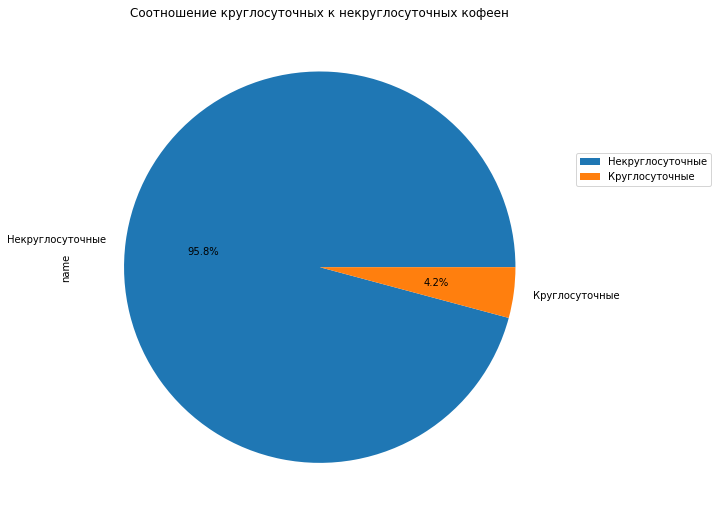

In [79]:
names = ['Некруглосуточные', 'Круглосуточные']
cofeynia2.plot(kind = 'pie', figsize = (9,9), y = 'name', labels = names, autopct='%1.1f%%')
plt.title('Соотношение круглосуточных к некруглосуточных кофеен')
plt.legend(bbox_to_anchor=( 1.3 , 0.7), loc='center right', borderaxespad= 0 ) 

<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">

__Вывод:__
    
На данном этапе было рассмотрено соотношение круглосуточных и некруглосуточных кофеен в датасете. Для большей наглядности была сформирована визуализация.
    
После анализа можно сделать заключение, что подавляющее большинство кофеен - некруглосуточные заведения (95,8%). Вывод можно считать надежным, так как для данной категории общепита круглосуточный режим работы не является выгодным и целесообразным.

***- Какие у кофеен рейтинги? Как они распределяются по районам?***

In [80]:
cofeynia3 = places_1.query('category == "кофейня"').groupby('district', as_index=False)['rating'].median()
cofeynia3.columns = ['district', 'rating_median']

In [81]:
cofeynia4 = places_1.query('category == "кофейня"').groupby('district_abr', as_index=False)['rating'].mean()\
.sort_values (by = 'rating', ascending = False)
cofeynia4 ['rating_median'] = cofeynia3['rating_median']
cofeynia4.columns = ['district', 'mean_rating', 'median_rating']
cofeynia4.sort_values(by = 'median_rating', ascending = False)

,district,mean_rating,median_rating
5,ЦАО,4.336449,4.3
4,СЗАО,4.325806,4.3
2,САО,4.291710,4.3
8,ЮЗАО,4.283333,4.3
0,ВАО,4.282857,4.3
6,ЮАО,4.232824,4.3
7,ЮВАО,4.225843,4.3
3,СВАО,4.216981,4.3
1,ЗАО,4.195333,4.2


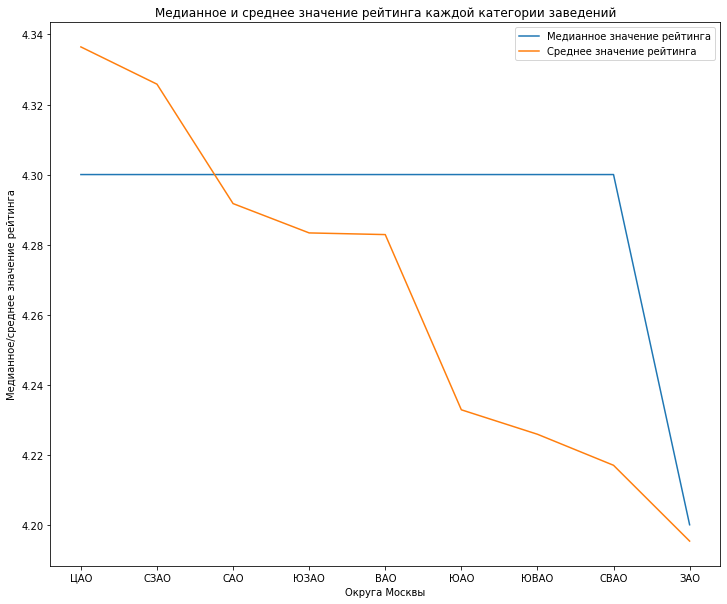

In [82]:
ax = cofeynia4.plot(x = 'district', y = 'median_rating',  figsize = (12,10))
cofeynia4.plot(x = 'district', y = 'mean_rating', ax=ax)
plt.xlabel('Округа Москвы')
plt.ylabel('Медианное/среднее значение рейтинга')  
plt.title('Медианное и среднее значение рейтинга каждой категории заведений')
plt.legend(['Медианное значение рейтинга', 'Среднее значение рейтинга'])

In [83]:
plt.figure (figsize = (15,18))
fig = px.bar(
    cofeynia4,\
    x = 'district', y = ['median_rating', 'mean_rating'],\
    title = 'Распределение рейтингов кофеен по округам Москвы', barmode = 'group')
fig.update_layout(xaxis_title = 'Округа Москвы', yaxis_title = 'Средний/Медианный рейтинг', legend_title= 'Рейтинги')
fig.show()

<Figure size 1080x1296 with 0 Axes>

<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">

__Вывод:__
    
На данном этапе были рассмотрены распределение медианных и средних рейтингов кофеен по округам Москвы. Для большей наглядности была сформирована визуализация.

После анализа можно сделать вывод, что средние (наиболее подвергающиеся частным случаям) и медианные значения (наиболее устойчивые к частным случаям) рейтингов по категориям заведений практически одинаковые, что может являться признаком отсутствия каких-либо аномальных показателей в данных. Однако, стоит отметить, что от лидера среди округов, Центрального административного округа, оба анализируемых показателя характеризуются спадом, который сходится у отметки Западного административного округа, что является наименьшим показателем. На данном этапе сложно выявить причину такой тенденции, с большей долей вероятности на это повлияли лишь предпочтения клиентов заведений и, возможно, какие-либо "аномальные" стечения обстоятельств.

***- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?***

In [84]:
cofeynia5 = places_1.query('category == "кофейня"').groupby('district', as_index=False)['middle_coffee_cup'].median()
cofeynia5.columns = ['district', 'cup_price_median']
cofeynia5.sort_values(by = 'cup_price_median', ascending = False)

,district,cup_price_median
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [85]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map (location = [moscow_lat, moscow_lng], zoom_start = 10, tiles = 'Cartodb Positron')
Choropleth (geo_data = state_geo, 
           data = cofeynia5,
           columns = ['district', 'cup_price_median'],
           key_on = 'feature.name',
           fill_color = 'YlGn',
           fill_opacity = 0.8,
           legend_name = 'Медианные значения средних цен одной чашки капучино по районам Москвы').add_to (m)
m

<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">

__Вывод:__

На данном этапе были рассмотрены средние значения стоимости чашки капучино. Для большей наглядности была построена фоновая картограмма (хороплет).

После анализа медианныых значений средних значений стоимости капучино было получено следующее распределение по округам Москвы (от наиболее дорогого к наиболее дешевому): 

1 - Юго-Западный административный округ	- 198.0\
2 - Центральный административный округ	- 190.0\
3 - Западный административный округ	- 189.0\
4 - Северо-Западный административный округ - 165.0\
5 - Северо-Восточный административный округ	- 162.5\
6 - Северный административный округ	- 159.0\
7 - Южный административный округ - 150.0\
8 - Юго-Восточный административный округ - 147.5\
9 - Восточный административный округ - 135.0	

Таким образом, заведения общественного питания с наибольшей средней ценой распологаются в Юго-Западном и Центральном административных округах, из чего следует, что приблеженность к центру города и престижность округа прямо влияют на уровень цен в заведениях общественного питания. Однако, следует также отметить, что распределение округов по наибольшему количеству кофеен на нем отличается от данного распределения цен, из чего можно сделать заключение, что количество заведений одной категории не влияет на ценообразование продуктов. 
    
При установлении цены в кофейнях на капучино стоит ориентироваться на показатели округа, в котором планируется открытие такого заведения. Тем неменее, стоит также ориентироваться на статус и концепцию будущего бизнеса, так, для кофеен высокого класса обслуживания с наилучшими сортами кофя и другими конкурентными преимуществами, будет возможно завысить средние показатели на чашку капучино, а для кофейни среднего класса - не стоит завышать средние показатели.

# Шаг 5. Вывод по проекту.
<a id="ending"></a>

<div  style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">

Инвесторы из фонда «Shut Up and Take My Money» заинтересованы в анализе перспектив их работы в новой для компании области и открыть заведение общественного питания в Москве. Заказчики на данный момент не утвердили никакие дополнительные критерии касательно категории места, его расположения, меню и цены.
    
В данном исследовании  необходимо было выявить текущие тренды рынка общепита Москвы. Основная задача для анализа - найти особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

В качестве материала для анализа был получен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 год. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер. Полный список данных следующий:

* name — название заведения;
* address — адрес заведения;
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* hours — информация о днях и часах работы;
* lat — широта географической точки, в которой находится заведение;
* lng — долгота географической точки, в которой находится заведение;
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона;
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill;
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill:
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
* district — административный район, в котором находится заведение, например Центральный административный округ;
* seats — количество посадочных мест.    
    
Работа над данным проектом была разделена на 4 шага:
1) Изучение общей информации\
2) Предобработка данных\
2.1) Обработка типов данных\
2.2) Обработка пропущенных значений в данных\
2.3) Обработка дубликатов\
2.4) Добавление новых показателей\
3) Исследовательский анализ данных\
4) Детализация исследования: открытие кофейни

    
При изучении общей информации удалось получить следующие выводы:
    
* обнаружено что, столбцы 'chain' и 'seats' - имеют некорректные типы данных, что может отразиться на будущих результатах. Однако, столбец 'seats', при дальнейшем ознакомлении с данными, имеет пропущенные/отсутсвующие значения, что не противоречит имеющимуся у него типу данных. Опираясь на данное предположение, на следущем этапе будут обработаны данный лишь столбца 'chain' будут заново проанализированы для устранения такого рода ошибок;
    
    
* при анализе заголовков столбцов не было выявлено никаких замечаний, которые должны подвергнуться дополнительному анализу.

    
* обаружено, что в 6 (шести) следующих столбцах: 'hours', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', 'seats' - присутсвуют пропущенные значения, они будут также более подробно изучены и устранены по возможности на следующем этапе работы;
    
    
* в данных не были обнаружены явные дубликаты данных, что свидетельствует о том, что абсолютно идентичные строки с информацией в файле не находятся.


При предобработке данных удалось:
    
* изменить тип данных столбца 'chain', который показывает, является ли заведение сетевым, на булев для упрощения работы над ним на других этапах работы;
    
    
* обработать пропуски в 6 (шести) столбцах из 14 (четырнадцати) в таблице
    
    причины появления пропусков в данных могут быть объяснены как ошибкой сервиса или его некорректной работой, ошибками при сборе данных, а также специальным пропуском данного поля; такие пропуски не были заменены ни на какое другое значение
    
    данное решение было принято по причине того, что данные пропуски появились в результате какой-либо автоматической ошибки или упущении при заполнении данных, а так как настоящая природа их возникновения не может быть выявлена и отсутствует другая информации, которая моглы бы являться базой для такого рода расчетов, следует, что заменить их на среднее или другие значения невозможно;
    
    
* проанализировать всю таблицу на предмет наличия в ней явных (полностью идентичных) дибликатов данных 
    
    получить список с уникальными значениями по каждому столбцу отдельно, на котором видно, что такое число в каждом столбце разное и не равно общему количеству

    подтвердить что, таких данных в таблице нет;
    
    
* добавить новые столбцы для того, чтобы более цело категаризовать данные, а также нагляднее и лаконичнее продемонстрировать их, в последующем для получения более полных результатов на дальнейших этапах анализа
    
    были сформированы следующие дополнительные столбцы:\
1) 'street с названиями улиц из столбца с адресом;\
2) 'is_24/7' с обозначением, что заведение работает ежедневно и круглосуточно (24/7).
    
    
На данном шаге по исследовательскому анализу данных были рассмотрены 12 (двенадцать) вопросов, которые в дальнейшем будут являться базой для ответа на поставленную задачу проекта. 

Изначально при анализе всех представленных в датасете категорий заведений общепита Москвы можно сделать заключение, что распределение категорий общепитов по распространенности следующее:\
    28,3% - кафе;\
    24,3% - рестораны;\
    16,8% - кофейни;\
    9,1% - бары/пабы;\
    7,5% - пиццерии;\
    7,2% - заведения быстрого питания;\
    3,7% - столовые;\
    3,0% - булочные.
    
После обработки количества посадочных мест категорий заведений общепита Москвы можно сделать заключение, что расчитанные медианные и средние значения посадочных мест разительно отличаются друг от друга внутри каждой категории. Так, были получены следующие медианные и средние (приведнные к целому) значения соответсвенно: \
бар,паб - 82.5 - 125\
булочная - 50.0	- 89\
быстрое питание	- 65.0 - 99\
кафе - 60.0 - 98\
кофейня	- 80.0 - 111\
пиццерия - 55.0 - 94\
ресторан - 86.0	- 122\
столовая - 75.5 - 100.
    
Из полученных данных получается, что средние показатели выше, чем медианнные, что не является ошибкой, ведь на первых влияют как аномально высокие, так и низкие показатели (например, если в одном пабе больше посадочных мест, чем в среднем характерно для пабов, когда как в другом пабе мест в разы меньше, чем в среднем для данной категории). Таким образом, беря во внимание описанную ранее особенность средних значений, при необходимости стоит опираться на медианные значения количества посадочных мест для общепита в Москве, так как они в большей степени отражают сложившуюся тенденцию на рынке без аномалий.

Рассматривая соотношения сетевых и несетевых заведений общепита в Москве было сделано заключение, что большая часть рынка общественного питания Москвы представлена несетевыми заведениями с 61,9% рынка, тогда как сетевые заведения занимают второе место - 38,1% рынка. Далее было найдено распределение категорий заведений в сетевом сегменте:\
кафе - 24,3%\
ресторан - 22,8%\
кофейня - 22,5%\
пиццерия - 10,3%\
быстрое питание	- 7,2%\
бар,паб	- 5,3%\
булочная - 4,9%\
столовая - 2,7%.

После анализа топ-15 популярных сетей общепитов в Москве количество заведений этой сети в регионе был получен следующий список самых популярных сетей общепитов с отображением категорий заведений (от наиболее распространенной сети к наименее):

1) Шоколадница, кофейня\
2) Домино'с Пицца, пиццерия\
3) Додо Пицца, пиццерия\
4) One Price Coffee, кофейня\
5) Яндекс Лавка, ресторан\
6) Cofix, кофейня\
7) Prime, ресторан\
8) КОФЕПОРТ, кофейня\
9) Кулинарная лавка братьев Караваевых, кафе\
10) Теремок, ресторан\
11) CofeFest, кофейня\
12) Чайхана, кафе\
13) Буханка, булочная\
14) Drive Café, кафе\
15) Кофемания, кофейня

Стоит отметить, что распределение категорий в данном пункте отличается от распределения, полученного в предыдущем: это объясняется тем, что в данной части были рассмотрены именно сети как таковые, то есть количество открытых заведений в определенной сети, что и выражается в отличных показателях относительно предыдущего пункта. Так, можно подчеркнуть, что чаще открывают различные сетевые кафе, однако, внутри такой сети количество заведений уступает, например, кофейням.

Также можно выявить некоторые закономерности, беря также во внимание результаты предыдущего пунка:

1) кофейни чаще всего являются самыми многочисленными заведениями внутри одной сети: запустить заведения такой категории сравнительно легче, так как это требует меньших вложений в пространство, разработку меню и т.д., формат кофейни также зачастую подразумевает заказы на вынос, возможность установления невысоких цен на продукцию и большой проходимостью, более того, зачастую они могут открываться под франшизой; стоит отметить, что влияние массовой культуры также способствует распространению и популярности кофеен;

2) пиццерии в меньшей степени, но тоже многочисленны внутри одной сети: они также часто открываются под франшизой, однако, требуют больших вложений, чем кофейни, что и обуславливает их меньшее количество;

3) ростораны, представленные в настоящем топ-листе ("Яндекс Лавка" и "Prime") не являются типичными представителями данной категории: "Яндекс Лавка" - сервис заказа готовой еды, продуктов и хозяйственных товаров на дом с локальных складов через мобильное приложение или веб-сайт, чья большая покрываемость обуславливается открытием большого числа складов с готовой продукцией (то есть не предусматривает физического потока клиентов); "Prime" - это сеть ресторанов здоровой еды, в основном оруентурующаяся на расположения в бизнес-центрах, в том числе корпоративные форматы, и стрит-ритейл, что в совокупности с франшизой, позволяет выбирать меньшие площади для заведений, следовательно повышать присутсвие в различных частях города;

4) кафе, представленные в данном списке, не все представляют возможность франшизы (например, "Кулинарная лавка братьев Караваевых"), однако, их распространенность обуславливается узнаваймостью среди клиентов, что способствует расширению сети; тем не менее, отрытие кафе требует гораздо больших вложений и анализа, что и не позволяет заведениям одной сети открываться часто и в больших количествах;

5) формат булочной ("Буханка") является единственным заведением категории в топ-листе: булочные на Московском рынке не распространенный формат заведений, что скорее является следствием отсутсвия данной культуры или тренда на покупку хлебо-булочных изделий в отдельном месте, клиенты скорее предпочтут поход в кофейню; однако, данная категория заведений наиболее распространена и характерна для рынка Санкт-Петербурга, тренды откуда могут влиять на близлежайшие рынки;

6) в получившемся списке отсутсвуют такие категории заведений как "столовая", "быстрое питание" и "бар,паб": такого рода заведения зачастую не являются сетевыми (см. Соотношение категорий сетевых заведений) или реже представлены в Москве.



Также были рассмотрены административные районы Москвы, общее количество заведений в них и количество заведений каждой категории по районам. После анализа был получен рейтинг административных районов Москвы по количеству заведений расположеных в них (от самого популярного к наименее популярному): 
    
1) Центральный административный округ (ЦАО) - 26,7%\
2) Северный административный округ (САО) - 10.7%\
3) Южный административный округ (ЮАО) - 10.6%\
4) Северо-Восточный административный округ (СВАО) - 10.6%\
5) Западный административный округ (ЗАО) - 10.1%\
6) Восточный административный округ (ВАО) - 9.5%\
7) Юго-Восточный административный округ (ЮВАО) - 8,5%\
8) Юго-Западный административный округ (ЮЗАО) - 8.4%\
9) Северо-Западный административный округ (СЗАО) - 4.9%\
    
Таким образом, можно сделать заключение, что лидером среди административных районов Москвы стал Центральный Административный округ (ЦАО), стоит также отметить особенность данного округа - лидирующую позицию по количуству заведений занимает категория "ресторан", что не характерно для остальных районов Москвы. Более того, в остальных округах Москвы наиболее популярная категория заведений - "кафе". Округ наиболее "неосвоенный" общепитом является Северо-Западный административный округ (СЗАО) - на него приходятся 4,9% всех заведений Москвы, в остальных же округах количество скорее одинаковое - разница колеблится в пределах 2,3%.

После анализа распределение медианных и средних рейтингов по категориям заведений был сделан вывод, что средние (наиболее подвергающиеся частным случаям) и медианные значения (наиболее устойчивые к частным случаям) рейтингов по категориям заведений практически одинаковые, что может являться признаком отсутствия каких-либо аномальных показателей в данных. Однако, стоит отметить, что при сопоставлении средних показателей рейтинга между категориями заведений прослеживается тенденция - категория "быстрое питание" в среднем получила самые низкие оценки рейтинга. Данный факт можно объяснить тем, что "бистро" зачастую подвергаются большей критики со стороны клиентов (нежели остальные категории заведений), так как не всегда способны на уровне удержать соотношение цены/качество, время готовности блюд и другие показатели/требования, которые к ним прменяются.

Был получен список топ-15 улиц и их долей от общего числа заведений общепита Москвы (от наиболее популярной к наименее популярной):

1) проспект Мира - 2.19%\
2) Профсоюзная улица - 1.45%\
3) проспект Вернадского - 1.28%\
4) Ленинский проспект - 1.27%\
5) Ленинградский проспект - 1.13%\
6) Дмитровское шоссе - 1.05%\
7) Каширское шоссе - 0.92%\
8) Варшавское шоссе - 0.90%\
9) Ленинградское шоссе - 0.83%\
10) МКАД - 0.77%\
11) Люблинская улица - 0.71%\
12) улица Вавилова - 0.65%\
13) Кутузовский проспект - 0.64%\
14) улица Миклухо-Маклая - 0.58%\
15) Пятницкая улица 0.57%

Таким образом, можно сделать вывод, что наиболее популярной улицей является "Проспект мира" с долей в 2,19% от числа всех заведений общественного питания Москвы, с лидирующей на ней категорией - "кафе". Стоит также отметить, что категория "кафе" является одной из самых распространенных на всех топ-15 улицах совместно с категорией "ресторан".

Также были рассмотрены улицы Москвы, на которых находится только один объект общепита. После анализа было получено, что таких улиц в датасете 458 штук, что составляет 5,45% от всех улиц, представленных в датасете. Также были рассмотрены категории заведений, встречающиеся на таких улицах (от наиболее распространенных до наименее распространенных):

1) кафе	- 160 (заведений) - 1.90% (от общего числа)\
2) ресторан	- 93 (заведений) - 1.11% (от общего числа)\
3) кофейня - 84	(заведений) - 1.00% (от общего числа)\
4) бар,паб - 39 (заведений) - 0.46% (от общего числа)\
5) столовая - 36 (заведений) - 0.43% (от общего числа)\
6) быстрое питание - 23 (заведений) - 0.27% (от общего числа)\
7) пиццерия - 15 (заведений) - 0.18% (от общего числа)\
8) булочная - 8 (заведений) - 0.10% (от общего числа)

Наиболее распространенная категории заведений на таких улицах - "кафе" или "ресторан": объяснением данного факта с большей долей вероятности является удаленность таких улиц от транспортных узлов или центра города (где большая проходимость и центр притяжения), поэтому ориентация в таких местах идет больше на семейные заведения. Средний рейтинг таких заведений в большей мере находится в диапозоне от 4.0 до 4.5, а наиболее часто ценивают кафе, рестораны и кофейни.

В заключение данного шага работы над проектом были рассмотрены значения средних чеков заведений, а для большей наглядности была построена фоновая картограмма (хороплет). После анализа медианныых значений средних чеков заведений было получено следующее распределение по округам Москвы (от наиболее дорогого к наиболее дешевому): 

1 - Западный административный округ - 1000.0\
2 - Центральный административный округ - 1000.0\
3 - Северо-Западный административный округ - 700.0\
4 - Северный административный округ - 650.0\
5 - Юго-Западный административный округ - 600.0\
6 - Восточный административный округ - 575.0\
7 - Северо-Восточный административный округ - 500.0\
8 - Южный административный округ - 500.0\
9 - Юго-Восточный административный округ - 450.0

Таким образом, заведения общественного питания с наибольшей средней ценой распологаются в Западном и Центральном административных округах, из чего следует, что приблеженность к центру города прямо влияет на уровень цен в заведениях общественного питания. Однако, следует также отметить, что и престижность округа города в равной степени влияет на ценообразование (чем спрестижнее округ, тем выше цены). Подтверждение тому тот факт, что Западный административный округ исторически считается одним из самых престижных и респектабельных в Москве, и уровень цен в нем, как и в Центральном округе, находится на одном уровне.

Стоит также отметить, что была построена фоновую картограмму (хороплет) со средним рейтингом заведений каждого района Москвы, а также были отображены все заведения датасета на карте Москвы.
    

На последнем, четвертом, шаге работы исследование было детализировано на предемет вопроса от заказчика о возможности открытия кофейни в Москве. Изначально было рассмотрено количество кофеен в датасете, в каких районах их больше всего и каковы особенности их расположения. После анализа можно сделать заключение, что количество кофеен в данном датасете равно 1413, что, в свою очередь, составляет 16,8% от общего числа заведений. Касательно их расположения по административным районам Москвы был получен следующий список : 
    
1) Центральный административный округ - 30.3%\
2) Северный административный округ - 13.7%\
3) Северо-Восточный административный округ - 11.3%\
4) Западный административный округ - 10.6%\
5) Южный административный округ - 9.3%\
6) Восточный административный округ - 7.4%\
7) Юго-Западный административный округ - 6.8%\
8) Юго-Восточный административный округ	- 6.3%\
9) Северо-Западный административный округ - 4.4%
    
Согласно получившемуся списку лидером среди округов является Центральный административный (30,3%): округ является транспортным узлом и местом притяжения большого количества людей каждый день, так как на его территории расположено большое количество досуговых заведений, достопримечательностей, а также офисов и рабочих мест.
    
Также были рассмотрены топ-15 улиц для расположения кофеен: 
    
1) проспект Мира - 2.5%\
2) Ленинградский проспект - 1.8%\
3) Ленинский проспект - 1.6%\
4) Профсоюзная улица - 1.3%\
5) проспект Вернадского - 1.1%\
6) Каширское шоссе - 1.1%\
7) Варшавское шоссе - 0.99%\
8) Кутузовский проспект	- 0.92%\
9) Новослободская улица	- 0.92%\
10) Ленинградское шоссе - 0.92%\
11) Новодмитровская улица - 0.85%\
12) Люблинская улица - 0.78%\
13) Дмитровское шоссе - 0.78%\
14) улица Вавилова - 0.71%\
15) Волгоградский проспект - 0.64%
    
Таким образом, наиболее "неселенная" кофейнями улица - проспект Мира, на которой расположено 2,5% всех кофеен Москвы. Как и в предыдущем шаге исследования данная улица является лидером по количеству заведений ни ней, такую тенденцию можно объяснить расположением на ней большого количества достопримечательностей, которые являются притягательными для пешеходных прогулок, что, в свою очередь, является источником клиентуры для такого рода заведений, как кофейни.
    
    
Затем было принято решение рассмотреть соотношение круглосуточных и некруглосуточных кофеен в датасете. После анализа можно сделать заключение, что подавляющее большинство кофеен - некруглосуточные заведения (95,8%). Вывод можно считать надежным, так как для данной категории общепита круглосуточный режим работы не является выгодным и целесообразным.
    
    
Более того, были рассмотрены распределение медианных и средних рейтингов кофеен по округам Москвы. После анализа можно сделать вывод, что средние (наиболее подвергающиеся частным случаям) и медианные значения (наиболее устойчивые к частным случаям) рейтингов по категориям заведений практически одинаковые, что может являться признаком отсутствия каких-либо аномальных показателей в данных. Однако, стоит отметить, что от лидера среди округов, Центрального административного округа, оба анализируемых показателя характеризуются спадом, который сходится у отметки Западного административного округа, что является наименьшим показателем. На данном этапе сложно выявить причину такой тенденции, с большей долей вероятности на это повлияли лишь предпочтения клиентов заведений и, возможно, какие-либо "аномальные" стечения обстоятельств.
    
    
В заключение, были рассмотрены средние значения стоимости чашки капучино. После анализа медианныых значений средних значений стоимости капучино было получено следующее распределение по округам Москвы (от наиболее дорогого к наиболее дешевому):\

1 - Юго-Западный административный округ	- 198.0\
2 - Центральный административный округ	- 190.0\
3 - Западный административный округ	- 189.0\
4 - Северо-Западный административный округ - 165.0\
5 - Северо-Восточный административный округ	- 162.5\
6 - Северный административный округ	- 159.0\
7 - Южный административный округ - 150.0\
8 - Юго-Восточный административный округ - 147.5\
9 - Восточный административный округ - 135.0	

Таким образом, заведения общественного питания с наибольшей средней ценой распологаются в Юго-Западном и Центральном административных округах, из чего следует, что приблеженность к центру города и престижность округа прямо влияют на уровень цен в заведениях общественного питания. Однако, следует также отметить, что распределение округов по наибольшему количеству кофеен на нем отличается от данного распределения цен, из чего можно сделать заключение, что количество заведений одной категории не влияет на ценообразование продуктов.

При установлении цены в кофейнях на капучино стоит ориентироваться на показатели округа, в котором планируется открытие такого заведения. Тем неменее, стоит также ориентироваться на статус и концепцию будущего бизнеса, так, для кофеен высокого класса обслуживания с наилучшими сортами кофя и другими конкурентными преимуществами, будет возможно завысить средние показатели на чашку капучино, а для кофейни среднего класса - не стоит завышать средние показатели.
    
    
Таким образом, на данной стадии исследования можно сделать вывод, что открытие кофейни возможно, так как не все округа Москвы имеют большое количество такого рода заведений, рейтинги которых, в целом, находятся на хорошем уровне. Однако, для конкретизации анализа и для получения более существенных и полных результатов, необходимо углубить и более детализировать требования к планируемому заведению, а также рассмотреть другие данные касательно востребованности таких заведений на рынке, предпочтений потребителей и тому подобное.

Презентация (с доработками): <https://disk.yandex.ru/i/IGC5pXzsu787SQ>